# Lab 5 Wavefront Sensor Lab - Data Analysis

This notebook analyzes data from a Shack-Hartmann wavefront sensor. The lab involves:
1. Detecting and measuring spot displacements on a CMOS detector
2. Calculating wavefront gradients from these displacements
3. Characterizing various optical aberrations (lenses, plastic)
4. Reconstructing and correcting wavefront aberrations using Zernike polynomials

**Key Parameters:**
- Lenslet array pitch: 300 μm
- Lenslet focal length: 14 mm
- Relay lens focal lengths: f₂ = 75 mm, f₃ = 25 mm
- Detector pixel size: 6.0 μm
- System magnification: M = f₃/f₂ = 1/3

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
import sys; sys.path.append('/home/dyson/fall25/180ASTR')
from match_stars import match_stars as ms
import a180
import os
from scipy.spatial import cKDTree
from scipy.ndimage import gaussian_filter, center_of_mass, maximum_filter
from scipy.optimize import curve_fit
import math

## Question 1

By what distance d is the focus displaced for a lens with focal length f given a wavefront tilt angle θ? (See Figure 2.) In the small angle approximation?

**Answer**

A wavefront tilted by an angle $\theta$ with respect to the optical axis
produces a chief ray that also makes an angle $\theta$ with the axis.

After passing through a lens of focal length $f$, this ray intersects the
focal plane at a transverse distance

$
d = f \tan\theta
$

Under the small-angle approximation ($\theta \ll 1$), $\tan\theta \approx \theta$, so

$
d \approx f\theta
$

## Initial Data Loading

Loading all FITS images from the data directory. Images include:
- Reference images (exp3_ref*): Unaberrated spots for baseline measurements
- Experiment 1 images (exp1_*): Single spot displacement measurements
- Experiment 5 images (exp5_plastic*): Plastic sheet aberrations
- Experiment 6 images (exp6_*): Various lens aberrations (convex/concave, spherical/cylindrical)

In [2]:
# Read in data
data_dir = "/home/dyson/fall25/180ASTR/Lab5/raw_data/"

# Saved plots
plot_dir = "/home/dyson/fall25/180ASTR/Lab5/plots/"

# Load all FITS files in directory
fits_files = sorted([f for f in os.listdir(data_dir) if f.endswith(".fits")])

images = {}
header = {}

for fname in fits_files:
    path = os.path.join(data_dir, fname)
    im = fits.getdata(path)
    print(fname)
    key = fname.replace(".fits", "")
    images[key] = im
    
hdr = fits.getheader(os.path.join(data_dir, fits_files[0]))
print(hdr.tostring(sep='\n'))

exp1_ref1.fits
exp1_ref2.fits
exp1_tilt1.fits
exp1_tilt2.fits
exp3_ref1.fits
exp3_ref2.fits
exp3_ref3.fits
exp5_plastic1.fits
exp5_plastic2.fits
exp5_plastic3.fits
exp6_concavecyl_1.fits
exp6_concavecyl_2.fits
exp6_concavesph_1.fits
exp6_concavesph_2.fits
exp6_convexcyl_1.fits
exp6_convexcyl_2.fits
exp6_convexsph_1.fits
exp6_convexsph_2.fits
SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -32 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                  640                                                  
NAXIS2  =                  480                                                  
EXTEND  =                    T                                                  
END                                                                                                                                                                       

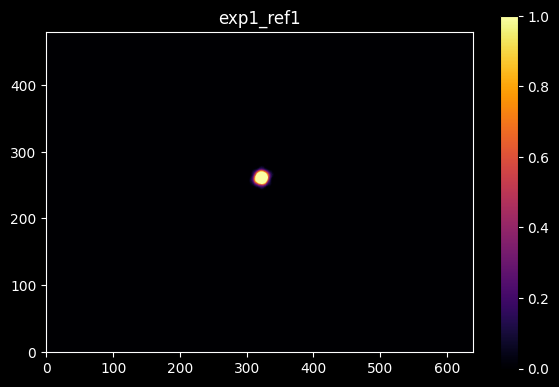

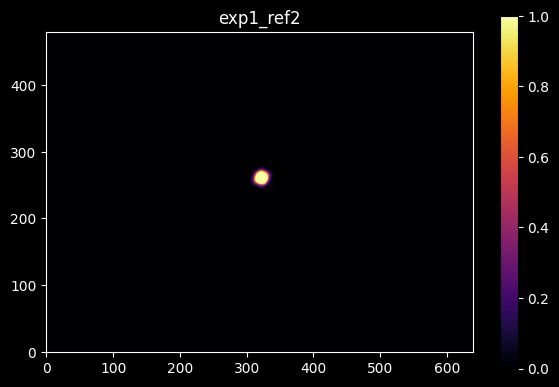

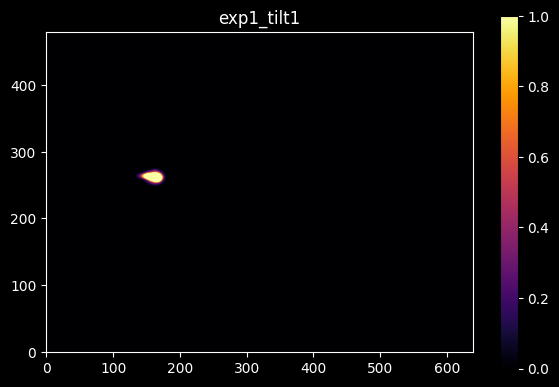

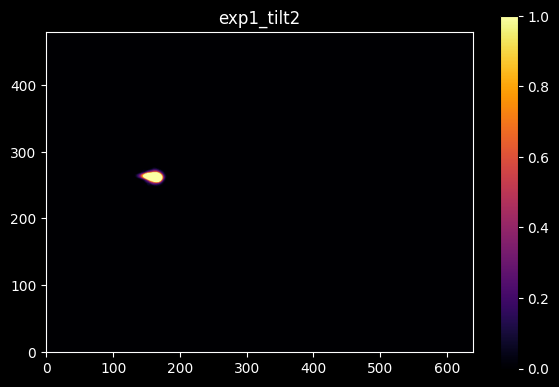

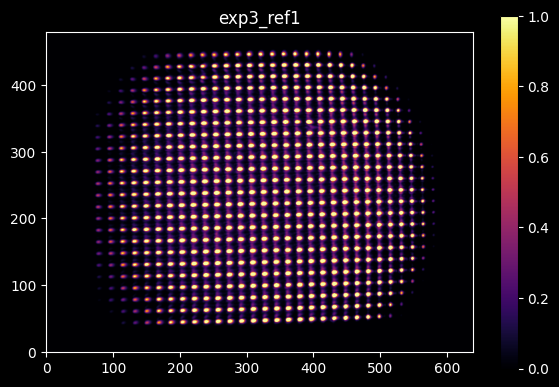

...

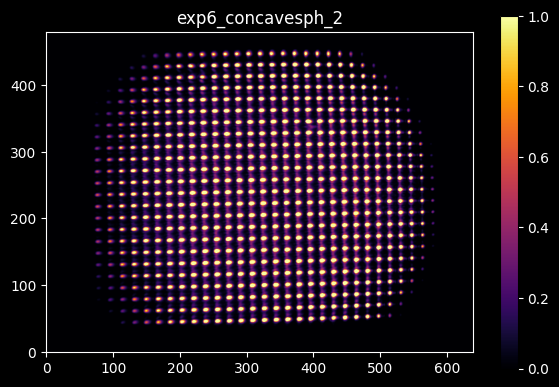

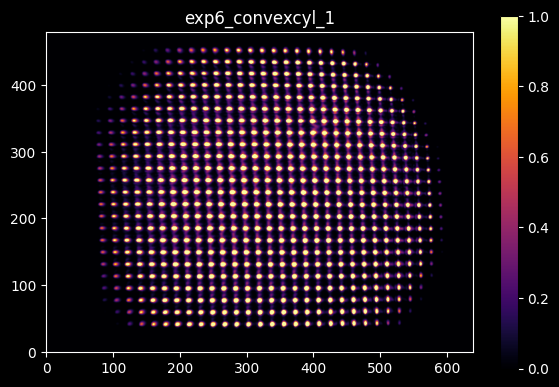

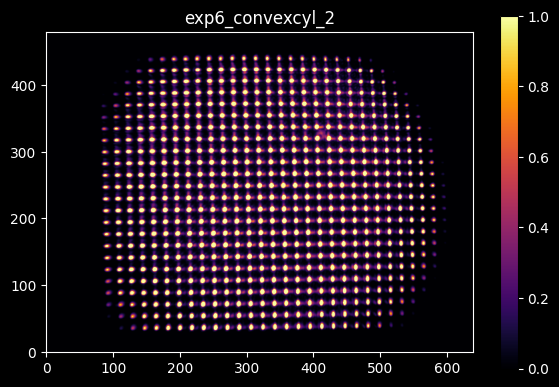

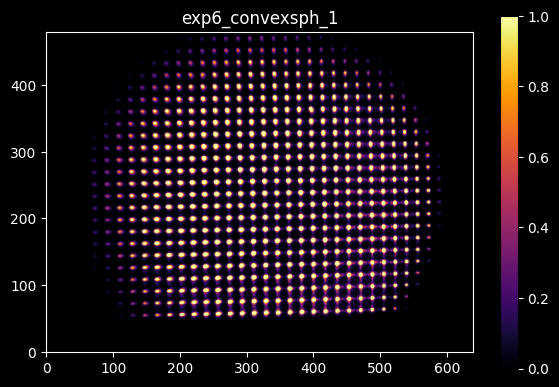

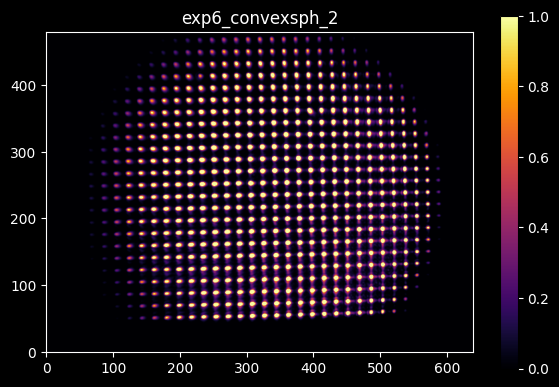

In [3]:
# Plot all loaded FITS images
for name, im in images.items():
    fig, ax = plt.subplots(figsize=(6,4), facecolor='black')
    ax.set_facecolor('black')
    
    img = ax.imshow(im, cmap="inferno", origin="lower")
    ax.set_title(name, color='white')
    ax.tick_params(colors='white')
    
    # Make colorbar with white text
    cbar = plt.colorbar(img, ax=ax)
    cbar.ax.yaxis.set_tick_params(color='white')
    plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='white')
    
    # Make spines white
    for spine in ax.spines.values():
        spine.set_color('white')
    
    plt.tight_layout()
    plt.show()

## Experiment 1: Verifying Expected Spot Displacement

**Goal:** Verify the relationship $ d = f\theta $ for a tilted wavefront.

**Method:**
1. Tilt the light source by a measured angle $\theta$
2. Measure the resulting spot displacement on the detector
3. Compare measured displacement to theoretical prediction:  (small angle approximation)

**Measurements:**
- Tilt was created by moving the front of the sensor block by 2.0 mm
- Block length determines the tilt angle: $\theta$ = displacement/length
- Focal length of sensor lens: 25 mm

In [4]:
# Measured values (ruler with 1mm ticks)
tile_dist = 2.0  # mm - dist the front of the sensor block was moved (±0.5mm)
d_short = 10.3  # cm - distance measurement when block flat (±0.5mm error)
d_long = 20.1   # cm - distance measurement when block flat (±0.5mm error)

# The block length is the difference between the measurements
# (these are measured from front of both blocks to back of both blocks)
block_length_cm = (d_long - d_short) / 2  # cm
block_length = block_length_cm * 10  # convert to mm
block_length_err = np.sqrt((0.5)**2 + (0.5)**2) / 2  # mm (propagated from 0.5mm errors)

print(f"Sensor block length: {block_length:.2f} ± {block_length_err:.2f} mm")

# Given values
focal_length = 25.0  # mm (sensor lens focal length)

# Calculate tilt angle in radians
# Back corner fixed, front corner moved by tile_dist over length block_length
theta = tile_dist / block_length  # radians

# Error propagation for arctan(a/b): δθ ≈ sqrt((δa/b)² + (a·δb/b²)²) / (1 + (a/b)²)
tile_dist_err = 0.5  # mm
theta_err = np.sqrt((tile_dist_err/block_length)**2 + 
                    (tile_dist*block_length_err/block_length**2)**2) / (1 + (tile_dist/block_length)**2)

print(f"Tilt angle θ: {theta:.6f} ± {theta_err:.6f} rad")
print(f"Tilt angle θ: {np.degrees(theta):.4f} ± {np.degrees(theta_err):.4f} degrees")

# Calculate expected displacement using d = f * θ (small angle approximation)
d_expected = focal_length * theta  # mm
d_expected_err = focal_length * theta_err  # mm

print(f"\nExpected displacement on detector: {d_expected:.3f} ± {d_expected_err:.3f} mm")

# Convert to pixels (assuming 6 micron pixel size from later in notebook)
pixel_size = 6e-3  # mm per pixel
d_expected_pixels = d_expected / pixel_size
d_expected_pixels_err = d_expected_err / pixel_size

print(f"Expected displacement in pixels: {d_expected_pixels:.2f} ± {d_expected_pixels_err:.2f} pixels")

Sensor block length: 49.00 ± 0.35 mm
Tilt angle θ: 0.040816 ± 0.010191 rad
Tilt angle θ: 2.3386 ± 0.5839 degrees

Expected displacement on detector: 1.020 ± 0.255 mm
Expected displacement in pixels: 170.07 ± 42.46 pixels


### Spot Centroid Detection

To accurately measure spot positions, we use two methods:
1. Simple center of mass: Fast initial estimate using intensity-weighted average
2. 2D Gaussian fitting: More accurate sub-pixel localization by fitting a Gaussian PSF to each spot

The Gaussian fit provides position uncertainties from the covariance matrix of the fit.

In [5]:
def gaussian_2d(xy, amplitude, xo, yo, sigma_x, sigma_y, offset):
    """2D Gaussian function for fitting"""
    x, y = xy
    xo = float(xo)
    yo = float(yo)    
    g = offset + amplitude * np.exp(-(((x-xo)**2)/(2*sigma_x**2) + ((y-yo)**2)/(2*sigma_y**2)))
    return g.ravel()

def find_centroid_gaussian(image, initial_guess=None, box_size=20):
    """
    Find centroid of bright spot using 2D Gaussian fitting
    
    Parameters:
    -----------
    image : 2D array
        Image data
    initial_guess : tuple, optional
        Initial guess for (x, y) position
    box_size : int
        Size of box around initial guess for fitting
    
    Returns:
    --------
    x_center, y_center : float
        Fitted centroid position
    x_err, y_err : float
        Estimated errors on centroid
    """
    if initial_guess is None:
        # Use center of mass as initial guess
        y_init, x_init = center_of_mass(image)
    else:
        x_init, y_init = initial_guess
    
    # Extract region around bright spot
    y_min = int(max(0, y_init - box_size))
    y_max = int(min(image.shape[0], y_init + box_size))
    x_min = int(max(0, x_init - box_size))
    x_max = int(min(image.shape[1], x_init + box_size))
    
    cutout = image[y_min:y_max, x_min:x_max]
    
    # Create coordinate arrays
    y_grid, x_grid = np.mgrid[0:cutout.shape[0], 0:cutout.shape[1]]
    
    # Initial parameters: amplitude, x0, y0, sigma_x, sigma_y, offset
    initial_params = [
        cutout.max() - cutout.min(),  # amplitude
        cutout.shape[1] / 2,           # x0
        cutout.shape[0] / 2,           # y0
        3.0,                           # sigma_x
        3.0,                           # sigma_y
        cutout.min()                   # offset
    ]
    
    try:
        # Fit 2D Gaussian
        popt, pcov = curve_fit(gaussian_2d, (x_grid, y_grid), cutout.ravel(), 
                               p0=initial_params, maxfev=5000)
        
        # Extract fitted center and errors
        x_center = popt[1] + x_min
        y_center = popt[2] + y_min
        
        # Errors from covariance matrix
        perr = np.sqrt(np.diag(pcov))
        x_err = perr[1]
        y_err = perr[2]
        
    except RuntimeError:
        # If fit fails, fall back to center of mass
        y_com, x_com = center_of_mass(cutout)
        x_center = x_com + x_min
        y_center = y_com + y_min
        x_err = 1.0  # Larger uncertainty for COM method
        y_err = 1.0
    
    return x_center, y_center, x_err, y_err

def find_bright_spot_simple(image, threshold_percentile=95):
    """
    Simple method: find brightest region and use center of mass
    
    Parameters:
    -----------
    image : 2D array
        Image data
    threshold_percentile : float
        Percentile threshold for identifying bright pixels
    
    Returns:
    --------
    x_center, y_center : float
        Center of mass of bright region
    """
    # Apply Gaussian filter to reduce noise
    smoothed = gaussian_filter(image, sigma=2.0)
    
    # Threshold to find bright pixels
    threshold = np.percentile(smoothed, threshold_percentile)
    bright_region = smoothed > threshold
    
    # Find center of mass
    y_center, x_center = center_of_mass(bright_region * smoothed)
    
    return x_center, y_center

### Processing Reference and Tilted Images

Finding centroids for both reference (untilted) and tilted images. We:
1. Detect bright spot regions using a threshold
2. Fit 2D Gaussian to get sub-pixel centroid positions
3. Average results from multiple images to reduce noise
4. Calculate displacement vector between reference and tilted positions

In [6]:
# Process reference images (exp1_ref1 and exp1_ref2)
ref_centroids = []
ref_errors = []

for key in ['exp1_ref1', 'exp1_ref2']:
    if key in images:
        img = images[key]
        
        # Method 1: Simple center of mass (fast)
        x_simple, y_simple = find_bright_spot_simple(img)
        
        # Method 2: Gaussian fit (more accurate)
        x_gauss, y_gauss, x_err, y_err = find_centroid_gaussian(img, 
                                                                  initial_guess=(x_simple, y_simple))
        
        ref_centroids.append([x_gauss, y_gauss])
        ref_errors.append([x_err, y_err])
        
        print(f"{key}:")
        print(f"  Simple CoM: ({x_simple:.2f}, {y_simple:.2f}) pixels")
        print(f"  Gaussian fit: ({x_gauss:.2f} ± {x_err:.3f}, {y_gauss:.2f} ± {y_err:.3f}) pixels")

# Calculate average reference position
ref_centroids = np.array(ref_centroids)
ref_errors = np.array(ref_errors)

ref_x_avg = np.mean(ref_centroids[:, 0])
ref_y_avg = np.mean(ref_centroids[:, 1])

# Error on the mean
ref_x_err = np.sqrt(np.sum(ref_errors[:, 0]**2)) / len(ref_centroids)
ref_y_err = np.sqrt(np.sum(ref_errors[:, 1]**2)) / len(ref_centroids)

print(f"\nAverage reference position:")
print(f"  ({ref_x_avg:.2f} ± {ref_x_err:.3f}, {ref_y_avg:.2f} ± {ref_y_err:.3f}) pixels")

# Process tilted images (exp1_tilt1 and exp1_tilt2)
tilt_centroids = []
tilt_errors = []

for key in ['exp1_tilt1', 'exp1_tilt2']:
    if key in images:
        img = images[key]
        
        x_simple, y_simple = find_bright_spot_simple(img)
        x_gauss, y_gauss, x_err, y_err = find_centroid_gaussian(img, 
                                                                  initial_guess=(x_simple, y_simple))
        
        tilt_centroids.append([x_gauss, y_gauss])
        tilt_errors.append([x_err, y_err])
        
        print(f"\n{key}:")
        print(f"  Simple CoM: ({x_simple:.2f}, {y_simple:.2f}) pixels")
        print(f"  Gaussian fit: ({x_gauss:.2f} ± {x_err:.3f}, {y_gauss:.2f} ± {y_err:.3f}) pixels")

# Calculate average tilted position
tilt_centroids = np.array(tilt_centroids)
tilt_errors = np.array(tilt_errors)

tilt_x_avg = np.mean(tilt_centroids[:, 0])
tilt_y_avg = np.mean(tilt_centroids[:, 1])

tilt_x_err = np.sqrt(np.sum(tilt_errors[:, 0]**2)) / len(tilt_centroids)
tilt_y_err = np.sqrt(np.sum(tilt_errors[:, 1]**2)) / len(tilt_centroids)

print(f"\nAverage tilted position:")
print(f"  ({tilt_x_avg:.2f} ± {tilt_x_err:.3f}, {tilt_y_avg:.2f} ± {tilt_y_err:.3f}) pixels")

# Calculate displacement
displacement_x = tilt_x_avg - ref_x_avg
displacement_y = tilt_y_avg - ref_y_avg
displacement_x_err = np.sqrt(ref_x_err**2 + tilt_x_err**2)
displacement_y_err = np.sqrt(ref_y_err**2 + tilt_y_err**2)

displacement_magnitude = np.sqrt(displacement_x**2 + displacement_y**2)
# Error propagation for magnitude
displacement_magnitude_err = np.sqrt(
    (displacement_x * displacement_x_err)**2 + 
    (displacement_y * displacement_y_err)**2
) / displacement_magnitude

print(f"\n{'='*60}")
print(f"Measured displacement:")
print(f"  Δx = {displacement_x:.2f} ± {displacement_x_err:.3f} pixels")
print(f"  Δy = {displacement_y:.2f} ± {displacement_y_err:.3f} pixels")
print(f"  |Δr| = {displacement_magnitude:.2f} ± {displacement_magnitude_err:.3f} pixels")

# Convert to mm
pixel_size_mm = 6e-3  # mm
displacement_mm = displacement_magnitude * pixel_size_mm
displacement_mm_err = displacement_magnitude_err * pixel_size_mm

print(f"  |Δr| = {displacement_mm:.3f} ± {displacement_mm_err:.3f} mm")
print(f"{'='*60}")

exp1_ref1:
  Simple CoM: (321.69, 260.12) pixels
  Gaussian fit: (321.68 ± 0.062, 260.13 ± 0.060) pixels
exp1_ref2:
  Simple CoM: (321.74, 260.13) pixels
  Gaussian fit: (321.74 ± 0.062, 260.13 ± 0.060) pixels

Average reference position:
  (321.71 ± 0.044, 260.13 ± 0.043) pixels

exp1_tilt1:
  Simple CoM: (159.67, 261.40) pixels
  Gaussian fit: (160.19 ± 0.122, 261.43 ± 0.059) pixels

exp1_tilt2:
  Simple CoM: (159.60, 261.45) pixels
  Gaussian fit: (160.14 ± 0.123, 261.48 ± 0.060) pixels

Average tilted position:
  (160.16 ± 0.087, 261.45 ± 0.042) pixels

Measured displacement:
  Δx = -161.54 ± 0.097 pixels
  Δy = 1.32 ± 0.060 pixels
  |Δr| = 161.55 ± 0.097 pixels
  |Δr| = 0.969 ± 0.001 mm


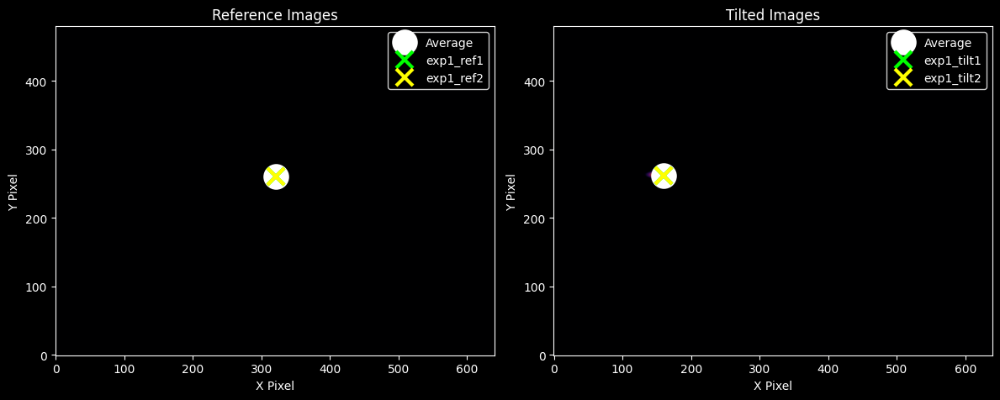

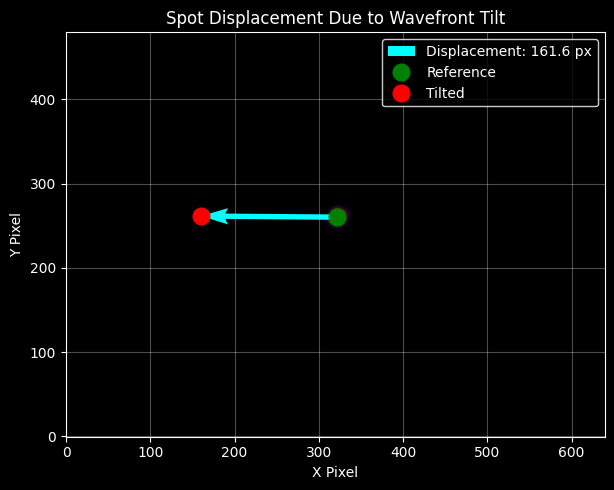

In [7]:
# Visualize the displacement
fig, axes = plt.subplots(1, 2, figsize=(12, 5), facecolor='black')

# Plot reference images with centroids
colors = ['lime', 'yellow']  # Different colors for each measurement
for i, key in enumerate(['exp1_ref1', 'exp1_ref2']):
    if key in images:
        axes[0].imshow(images[key], cmap='inferno', origin='lower', alpha=0.5)

# Plot average first (so crosses go on top)
axes[0].plot(ref_x_avg, ref_y_avg, 'wo', markersize=20, 
             markeredgewidth=2, label='Average', zorder=2)

# Then plot individual measurements on top
for i, key in enumerate(['exp1_ref1', 'exp1_ref2']):
    if key in images:
        axes[0].plot(ref_centroids[i, 0], ref_centroids[i, 1], 'x', 
                     color=colors[i], markersize=15, markeredgewidth=3, 
                     label=key, zorder=3)

axes[0].set_xlabel('X Pixel', color='white')
axes[0].set_ylabel('Y Pixel', color='white')
axes[0].set_title('Reference Images', color='white')
axes[0].legend(facecolor='black', edgecolor='white', labelcolor='white')
axes[0].set_facecolor('black')
axes[0].tick_params(colors='white')
axes[0].spines['bottom'].set_color('white')
axes[0].spines['top'].set_color('white')
axes[0].spines['left'].set_color('white')
axes[0].spines['right'].set_color('white')

# Plot tilted images with centroids
for i, key in enumerate(['exp1_tilt1', 'exp1_tilt2']):
    if key in images:
        axes[1].imshow(images[key], cmap='inferno', origin='lower', alpha=0.5)

# Plot average first (so crosses go on top)
axes[1].plot(tilt_x_avg, tilt_y_avg, 'wo', markersize=20, 
             markeredgewidth=2, label='Average', zorder=2)

# Then plot individual measurements on top
for i, key in enumerate(['exp1_tilt1', 'exp1_tilt2']):
    if key in images:
        axes[1].plot(tilt_centroids[i, 0], tilt_centroids[i, 1], 'x',
                     color=colors[i], markersize=15, markeredgewidth=3,
                     label=key, zorder=3)

axes[1].set_xlabel('X Pixel', color='white')
axes[1].set_ylabel('Y Pixel', color='white')
axes[1].set_title('Tilted Images', color='white')
axes[1].legend(facecolor='black', edgecolor='white', labelcolor='white')
axes[1].set_facecolor('black')
axes[1].tick_params(colors='white')
axes[1].spines['bottom'].set_color('white')
axes[1].spines['top'].set_color('white')
axes[1].spines['left'].set_color('white')
axes[1].spines['right'].set_color('white')

plt.tight_layout()
plt.savefig(plot_dir + 'exp1_ref_vs_tilt_centroids.png', dpi=300, facecolor='black')
plt.show()

# Create displacement vector plot
fig, ax = plt.subplots(figsize=(8, 5), facecolor='black')

# Show one reference image as background
ax.imshow(images['exp1_ref1'], cmap='inferno', origin='lower', alpha=0.3)

# Plot displacement vector
ax.quiver(ref_x_avg, ref_y_avg, displacement_x, displacement_y,
          angles='xy', scale_units='xy', scale=1, color='cyan', width=0.01,
          label=f'Displacement: {displacement_magnitude:.1f} px')

ax.plot(ref_x_avg, ref_y_avg, 'go', markersize=12, label='Reference')
ax.plot(tilt_x_avg, tilt_y_avg, 'ro', markersize=12, label='Tilted')

ax.set_xlabel('X Pixel', color='white')
ax.set_ylabel('Y Pixel', color='white')
ax.set_title('Spot Displacement Due to Wavefront Tilt', color='white')
ax.legend(facecolor='black', edgecolor='white', labelcolor='white')
ax.grid(alpha=0.3, color='white')
ax.set_facecolor('black')
ax.tick_params(colors='white')
ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white')
ax.spines['left'].set_color('white')
ax.spines['right'].set_color('white')

plt.tight_layout()
plt.savefig(plot_dir + 'exp1_displacement_vector.png', dpi=300, facecolor='black')
plt.show()

## Question 2
What would the displacement pattern look like if a positive lens were placed in the collimated beam entering the sensor?

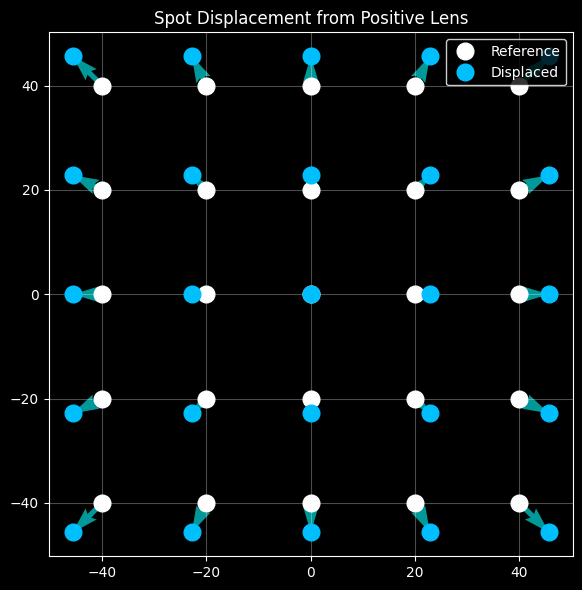

In [8]:
# Parameters
grid_size = 5
spacing = 20
max_disp = 8  # maximum outward displacement at corners

# Create grid of reference positions (centered at origin)
x = np.arange(grid_size) - (grid_size-1)/2
y = np.arange(grid_size) - (grid_size-1)/2
X, Y = np.meshgrid(x, y)
ref_x = X.flatten() * spacing
ref_y = Y.flatten() * spacing

# Simulate radial displacement from positive lens
radius = np.sqrt(ref_x**2 + ref_y**2)
max_radius = radius.max()
scale = max_disp / max_radius if max_radius != 0 else 0
disp_x = ref_x * scale
disp_y = ref_y * scale

tilt_x = ref_x + disp_x
tilt_y = ref_y + disp_y

# Plot
fig, ax = plt.subplots(figsize=(6,6), facecolor='black')
ax.set_facecolor('black')

# Reference spots
ax.plot(ref_x, ref_y, 'o', markersize=12, color='white', label='Reference')

# Tilted/displaced spots
ax.plot(tilt_x, tilt_y, 'o', markersize=12, color='deepskyblue', label='Displaced')

# Vectors showing displacement
ax.quiver(ref_x, ref_y, disp_x, disp_y, angles='xy', scale_units='xy', scale=1,
          color='cyan', width=0.01, alpha=0.6)

# Styling
ax.set_title('Spot Displacement from Positive Lens', color='white')
ax.legend(facecolor='black', edgecolor='white', labelcolor='white')
ax.grid(alpha=0.3, color='white')
ax.tick_params(colors='white')
for spine in ax.spines.values():
    spine.set_color('white')
ax.set_aspect('equal')

plt.tight_layout()
plt.savefig(plot_dir + 'Q2.png', dpi=300, facecolor='black')
plt.show()


## Question 3

You have a microlens array in a rectangular mount (Fig. 7). The array is a ThorLabs MLA300-14AR, which is a $10\ \text{mm} \times 10\ \text{mm}$ array with a square grid of microlenses, having a $300\ \mu\text{m}$ pitch. Each lenslet has a $14\ \text{mm}$ focal length. You also have a CMOS detector, which has a $752 \times 480$ pixel array with $6.0\ \mu\text{m}$ square pixels.

What would happen if the spots were focused directly on the detector? How many pixels between each spot, and how many spots will be imaged?

**Answer**

The microlens array is $10\ \text{mm} \times 10\ \text{mm}$ with a pitch of $p = 300\ \mu\text{m}$. The number of microlenses along one side is

$
N_\text{lenses} = \frac{10\ \text{mm}}{0.3\ \text{mm}} \approx 33
$

so the array has roughly $33 \times 33$ microlenses.

The spot spacing on the detector is equal to the lenslet pitch projected through the focal length. Since the spots are focused directly on the detector, the spacing is approximately

$
\text{spot spacing} = p = 300\ \mu\text{m}
$

Converting to pixels (pixel size $6\ \mu\text{m}$):

$
\text{pixels between spots} = \frac{300\ \mu\text{m}}{6\ \mu\text{m/pixel}} = 50\ \text{pixels}
$

The detector size is $752 \times 480$ pixels, corresponding to

$
\text{detector width} = 752 \cdot 6\ \mu\text{m} = 4.512\ \text{mm}, \quad
\text{detector height} = 480 \cdot 6\ \mu\text{m} = 2.88\ \text{mm}
$

The number of spots that fit on the detector is

$
N_x = \frac{4.512\ \text{mm}}{0.3\ \text{mm}} \approx 15, \quad
N_y = \frac{2.88\ \text{mm}}{0.3\ \text{mm}} \approx 9
$

Thus, only about $15 \times 9$ spots will be imaged, with approximately 50 pixels between each spot. The spots are well-separated, but the detector only captures a fraction of the full microlens array.

## Experiment 4 & Questions 4-6: Shack-Hartmann Sensor Characterization

**Objective:** Measure actual spot spacing and compare to theoretical predictions.

Summary of size scales in the optical system**

| Component       | Quantity        | Symbol | Value        |
|-----------------|----------------|--------|-------------|
| Lenslet array   | Pitch          | $p$    | 300 µm      |
| Lenslet array   | Focal length   | $f_1$  | 14 mm       |
| Lens            | Focal length   | $f_2$  | 75 mm       |
| Sensor lens     | Focal length   | $f_3$  | 25 mm       |
| Detector        | Pixel scale    | $\Delta x$ | 6.0 µm |

#### Q4: What do you expect the physical spacing between spots to be on the detector, in microns? In pixels? Note values for the various length scales are given in Table 1.


The microlens array pitch is $p = 300\ \mu\text{m}$, and the optical relay magnifies the spots by the lens ratio $M = f_3 / f_2$. The physical spacing on the detector is

$
\text{spot spacing} = p \frac{f_3}{f_2} = 300\ \mu\text{m} \cdot \frac{25\ \text{mm}}{75\ \text{mm}} = 100\ \mu\text{m}
$

Converting to pixels (pixel size $\Delta x = 6\ \mu\text{m}$):

$
\text{pixels between spots} = \frac{100\ \mu\text{m}}{6\ \mu\text{m/pixel}} \approx 16.7 \approx 17\ \text{pixels}
$

#### Q5: You calculated the physical displacement of a spot in the lenslet’s focal plane for a beam deviation of angle θ. What will this displacement be in the detector plane, in pixels?

A beam deviation of angle $\theta$ produces a transverse displacement in the lenslet focal plane of

$
d = f_1 \theta
$

The optical relay magnifies this displacement by $M = f_3 / f_2$, so in the detector plane:

$
d_\text{detector} = d \frac{f_3}{f_2} = f_1 \theta \frac{f_3}{f_2}
$

Converting to pixels:

$
\text{pixels} = \frac{d_\text{detector}}{\Delta x} = \frac{f_1 \theta (f_3 / f_2)}{\Delta x}
$

#### Q6: What will this displacement be as a fraction of the spacing between spots?

The displacement as a fraction of the spacing between spots:

$
\text{fraction} = \frac{d_\text{detector}}{\text{spot spacing}} = \frac{f_1 \theta (f_3 / f_2)}{p (f_3 / f_2)} = \frac{f_1 \theta}{p}
$

So the fractional displacement on the detector is the same as the fractional displacement in the lenslet focal plane:

$
\text{fraction} = \frac{f_1 \theta}{p}
$

In [9]:
# Parameters
p = 300e-6        # Lenslet pitch in meters
f1 = 14e-3        # Lenslet focal length in meters
f2 = 75e-3        # Relay lens focal length in meters
f3 = 25e-3        # Sensor lens focal length in meters
pixel_size = 6e-6 # Detector pixel size in meters
detector_pixels_x = 640
detector_pixels_y = 480

# Magnification of the optical relay
M = f3 / f2

# Spot spacing on the detector (physical)
spot_spacing_m = p * M
spot_spacing_pix = spot_spacing_m / pixel_size

# Detector physical size
detector_width_m = detector_pixels_x * pixel_size
detector_height_m = detector_pixels_y * pixel_size

# Number of spots that fit on the detector
N_spots_x = int(detector_width_m // spot_spacing_m)
N_spots_y = int(detector_height_m // spot_spacing_m)
total_spots = N_spots_x * N_spots_y

print(f"Spot spacing: {spot_spacing_m*1e6:.1f} µm ({spot_spacing_pix:.1f} pixels)")
print(f"Number of spots on detector: {N_spots_x} x {N_spots_y} = {total_spots}")

Spot spacing: 100.0 µm (16.7 pixels)
Number of spots on detector: 38 x 28 = 1064


### Spot Detection Algorithm

**Process:**
1. Apply Gaussian smoothing to reduce noise
2. Use local maximum filter to find peaks
3. Threshold to identify spots (85th percentile by default)
4. Refine positions using center-of-mass within small box around each peak

This provides robust detection even with varying brightness and noise.

In [10]:
def detect_spots(image, psf_sig=1.5, threshold_percentile=85):
    """
    Detect spots in an image using local maximum filtering.
    
    Parameters:
    -----------
    image : 2D array
        Input image
    psf_sig : float
        Gaussian filter sigma in pixels
    threshold_percentile : float
        Percentile threshold for spot detection
    
    Returns:
    --------
    dot_pos_initial : array, shape (N_spots, 2)
        Integer pixel coordinates (y, x) of detected spots
    """
    # Apply Gaussian filter to suppress noise
    filtered = gaussian_filter(image, sigma=psf_sig)
    
    # Local maximum filter
    max_filt = int(2.35 * psf_sig)
    mim = maximum_filter(filtered, size=max_filt)
    
    # Threshold
    threshold = np.percentile(filtered, threshold_percentile)
    
    # Find peaks
    is_peak = (filtered == mim) & (filtered > threshold)
    
    # Get coordinates
    peaklocs = np.nonzero(is_peak)
    dot_pos_initial = np.array(peaklocs).T  # (y, x)
    
    return dot_pos_initial


def refine_centroids(image, dot_pos_initial, box_size=3):
    """
    Refine spot positions to sub-pixel accuracy using centroid.
    
    Parameters:
    -----------
    image : 2D array
        Input image
    dot_pos_initial : array, shape (N_spots, 2)
        Integer pixel coordinates (y, x)
    box_size : int
        Half-width of box around each spot for centroid calculation
    
    Returns:
    --------
    dot_pos_refined : array, shape (N_spots, 2)
        Refined sub-pixel coordinates (y, x)
    """
    refined_positions = []
    
    for i in range(len(dot_pos_initial)):
        y_int, x_int = dot_pos_initial[i, :]
        
        # Extract region around spot
        y_min = max(0, y_int - box_size)
        y_max = min(image.shape[0], y_int + box_size)
        x_min = max(0, x_int - box_size)
        x_max = min(image.shape[1], x_int + box_size)
        cutout = image[y_min:y_max, x_min:x_max]
        
        # Find sub-pixel centroid
        try:
            y_local, x_local = center_of_mass(cutout)
            y_refined = y_local + y_min
            x_refined = x_local + x_min
            refined_positions.append([y_refined, x_refined])
        except:
            # If centroid fails, keep integer position
            refined_positions.append([y_int, x_int])
    
    return np.array(refined_positions)


def get_spacing_stats(dot_positions, pixel_size_um=6.0):
    """
    Calculate spacing statistics between nearest-neighbor spots.
    
    Parameters:
    -----------
    dot_positions : array, shape (N_spots, 2)
        Spot coordinates (y, x)
    pixel_size_um : float
        Pixel size in microns
    
    Returns:
    --------
    stats : dict
        Dictionary containing:
        - mean_pixels: mean spacing in pixels
        - std_pixels: standard deviation in pixels
        - mean_um: mean spacing in microns
        - std_um: standard deviation in microns
        - median_pixels: median spacing in pixels
        - all_distances: array of all nearest-neighbor distances
    """
    # Build KDTree
    tree = cKDTree(dot_positions)
    
    # Find nearest neighbor for each spot
    distances, indices = tree.query(dot_positions, k=2)
    
    # distances[:, 0] is distance to itself (always 0)
    # distances[:, 1] is distance to nearest neighbor
    nearest_distances = distances[:, 1]
    
    # Calculate statistics
    mean_pixels = np.mean(nearest_distances)
    std_pixels = np.std(nearest_distances)
    median_pixels = np.median(nearest_distances)
    
    mean_um = mean_pixels * pixel_size_um
    std_um = std_pixels * pixel_size_um
    
    return {
        'mean_pixels': mean_pixels,
        'std_pixels': std_pixels,
        'mean_um': mean_um,
        'std_um': std_um,
        'median_pixels': median_pixels,
        'all_distances': nearest_distances
    }

### Creating Reference Spot Map

Averaging two reference images improves signal-to-noise ratio for more accurate spot detection.
This reference map serves as the baseline for measuring aberrations - any displacement from these
positions indicates wavefront distortion.

In [11]:
# Loop through all images whose key starts with "exp3_ref"
# We named the files wrong, these are the references for exp 4, but keeping the name so it matches the logs
for key, x in images.items():
    if not key.startswith("exp3_ref"):
        continue

    # Histogram for vmin/vmax selection
    flat = x.flatten()
    counts, bins, _ = plt.hist(flat, bins=50)
    plt.close()  # close histogram figure

    hist_low_lim = bins[1]
    hist_upp_lim = bins[-2]
    '''
    # Plot image
    plt.figure(figsize=(6,6))
    plt.imshow(x, vmin=hist_low_lim, vmax=hist_upp_lim, origin='lower', cmap='inferno')
    plt.xlabel("X Pixel")
    plt.ylabel("Y Pixel")
    plt.title(f"Reference Spots on CMOS Detector ({key})")
    plt.colorbar()
    plt.tight_layout() 
    plt.show()
    '''

In [12]:
# Average all exp3_ref images for better SNR
exp3_refs = [images[key] for key in images.keys() if key.startswith("exp3_ref")]
data = np.mean(exp3_refs, axis=0)

print(f"Using average of {len(exp3_refs)} reference images")

# Detect spots at integer positions
dot_pos_initial = detect_spots(data, psf_sig=2, threshold_percentile=85)
print(f"Detected {len(dot_pos_initial)} spots (integer positions)")

# Refine to sub-pixel accuracy
print("Refining positions with centroid fitting")
dot_pos_lens = refine_centroids(data, dot_pos_initial, box_size=3)
print(f"Refined {len(dot_pos_lens)} spot positions")

N_dot = len(dot_pos_lens)

Using average of 3 reference images
Detected 594 spots (integer positions)
Refining positions with centroid fitting
Refined 594 spot positions


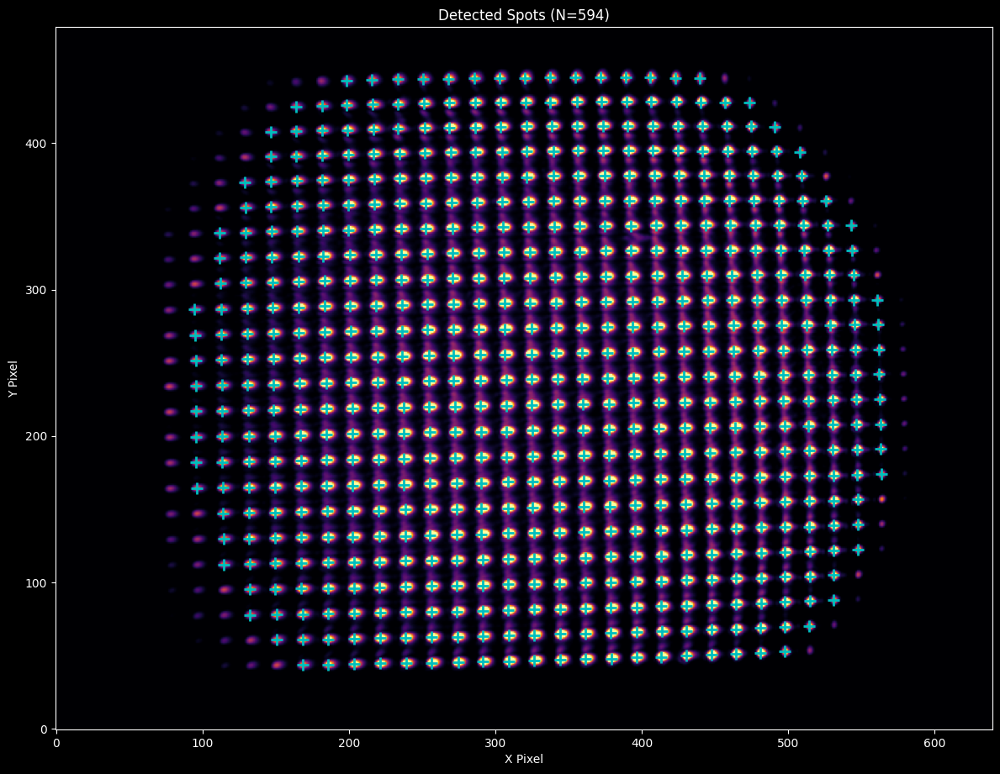

In [13]:
# Create histogram for display limits
counts, bins = np.histogram(data.flatten(), bins=50)
hist_low_lim = bins[1]
hist_upp_lim = bins[-2]

# Plot detections
fig, ax = plt.subplots(1, figsize=(12, 10), facecolor='black')
ax.imshow(data, origin='lower', vmin=hist_low_lim, vmax=hist_upp_lim, cmap='inferno')

# Plot detected spots
for i in range(N_dot):
    ypix, xpix = dot_pos_lens[i, :]
    ax.plot(xpix, ypix, 'c+', markersize=10, markeredgewidth=2)

ax.set_xlabel('X Pixel', color='white')
ax.set_ylabel('Y Pixel', color='white')
ax.set_title(f'Detected Spots (N={N_dot})', color='white')
ax.set_facecolor('black')
ax.tick_params(colors='white')
for spine in ax.spines.values():
    spine.set_color('white')

plt.tight_layout()
plt.savefig(plot_dir + 'exp4_detected_spots.png', dpi=300, facecolor='black')
plt.show()

get displacement stuff

In [14]:
# Get spacing statistics
spacing_stats = get_spacing_stats(dot_pos_lens, pixel_size_um=6.0)

mean_spacing_pixels = spacing_stats['mean_pixels']
std_spacing_pixels = spacing_stats['std_pixels']
median_spacing_pixels = spacing_stats['median_pixels']
nearest_neighbor_distances = spacing_stats['all_distances']
mean_spacing_um = spacing_stats['mean_um']
std_spacing_um = spacing_stats['std_um']


print("Measured spot spacing:")

print(f"Mean spacing:   {mean_spacing_pixels:.3f} ± {std_spacing_pixels:.3f} pixels")
print(f"Median spacing: {median_spacing_pixels:.3f} pixels")
print(f"Min spacing:    {np.min(nearest_neighbor_distances):.3f} pixels")
print(f"Max spacing:    {np.max(nearest_neighbor_distances):.3f} pixels")
print(f"\nMean spacing:   {mean_spacing_um:.2f} ± {std_spacing_um:.2f} µm")

# Theoretical calculations from Q4
print("Theoretical (Q4):")


# Magnification
M = f3 / f2
print(f"Magnification M = f3/f2 = {f3}/{f2} = {M:.4f}")

# Expected spot spacing on detector
expected_spacing_um = p * M
expected_spacing_pixels = expected_spacing_um / pixel_size

print(f"\nExpected spot spacing:")
print(f"  {expected_spacing_um:.1f} µm")
print(f"  {expected_spacing_pixels:.3f} pixels")

# Compare measured to theoretical
print("Comparison:")

difference_pixels = mean_spacing_pixels - expected_spacing_pixels
difference_um = mean_spacing_um - expected_spacing_um
percent_difference = (difference_pixels / expected_spacing_pixels) * 100

print(f"Measured:   {mean_spacing_pixels:.3f} ± {std_spacing_pixels:.3f} pixels")
print(f"Expected:   {expected_spacing_pixels:.3f} pixels")
print(f"Difference: {difference_pixels:.3f} pixels ({percent_difference:.1f}%)")
print(f"\nMeasured:   {mean_spacing_um:.2f} ± {std_spacing_um:.2f} µm")
print(f"Expected:   {expected_spacing_um:.1f} µm")
print(f"Difference: {difference_um:.2f} µm")

Measured spot spacing:
Mean spacing:   16.903 ± 0.342 pixels
Median spacing: 17.038 pixels
Min spacing:    16.103 pixels
Max spacing:    17.787 pixels

Mean spacing:   101.42 ± 2.05 µm
Theoretical (Q4):
Magnification M = f3/f2 = 0.025/0.075 = 0.3333

Expected spot spacing:
  0.0 µm
  16.667 pixels
Comparison:
Measured:   16.903 ± 0.342 pixels
Expected:   16.667 pixels
Difference: 0.236 pixels (1.4%)

Measured:   101.42 ± 2.05 µm
Expected:   0.0 µm
Difference: 101.42 µm


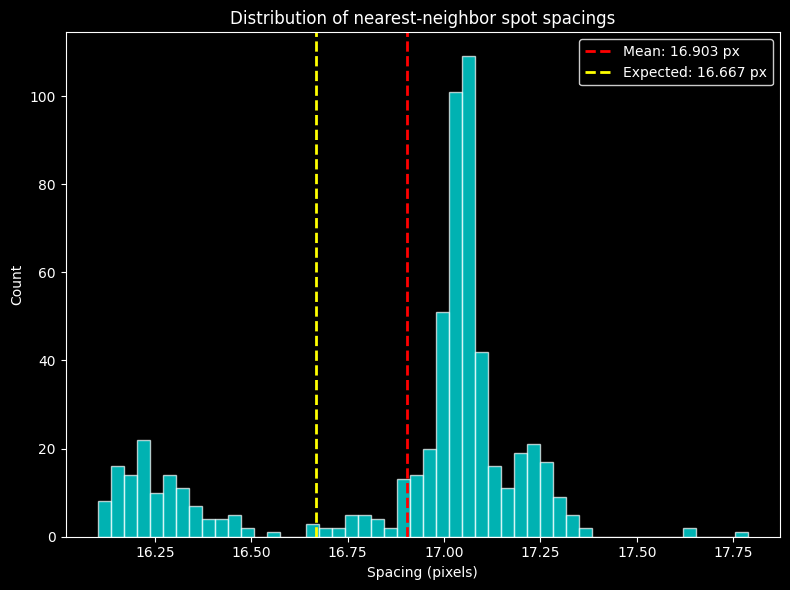

In [15]:
fig, ax = plt.subplots(figsize=(8, 6), facecolor='black')
ax.hist(nearest_neighbor_distances, bins=50, color='cyan', edgecolor='white', alpha=0.7)
ax.axvline(mean_spacing_pixels, color='red', linestyle='--', linewidth=2, 
           label=f'Mean: {mean_spacing_pixels:.3f} px')
ax.axvline(expected_spacing_pixels, color='yellow', linestyle='--', linewidth=2,
           label=f'Expected: {expected_spacing_pixels:.3f} px')

ax.set_xlabel('Spacing (pixels)', color='white')
ax.set_ylabel('Count', color='white')
ax.set_title('Distribution of nearest-neighbor spot spacings', color='white')
ax.legend(facecolor='black', edgecolor='white', labelcolor='white')
ax.set_facecolor('black')
ax.tick_params(colors='white')
for spine in ax.spines.values():
    spine.set_color('white')

plt.tight_layout()
plt.savefig(plot_dir + 'exp4_spacing_histogram.png', dpi=300, facecolor='black')
plt.show()

## Experiments 5 & 6: Aberration Measurements

**Experiment 5:** Plastic sheet aberrations (turbulence-like, random phase distortions)

**Experiment 6:** Systematic lens aberrations:

For each aberration, we:
1. Detect spot positions in the aberrated image
2. Match spots to reference positions
3. Calculate displacement vectors
4. Convert to wavefront phase gradients

In [16]:
# Define lens data with strengths (no error given, so exact values)
lens_data = {
    'exp6_concavecyl_1': {'strength': 1.00, 'type': 'concave_cyl'},
    'exp6_concavecyl_2': {'strength': 1.00, 'type': 'concave_cyl'},
    'exp6_concavesph_1': {'strength': 0.75, 'type': 'concave_sph'},
    'exp6_concavesph_2': {'strength': 0.75, 'type': 'concave_sph'},
    'exp6_convexcyl_1': {'strength': 1.00, 'type': 'convex_cyl'},
    'exp6_convexcyl_2': {'strength': 1.00, 'type': 'convex_cyl'},
    'exp6_convexsph_1': {'strength': 0.75, 'type': 'convex_sph'},
    'exp6_convexsph_2': {'strength': 0.75, 'type': 'convex_sph'},
    'exp5_plastic1': {'strength': 0.0, 'type': 'plastic'},
    'exp5_plastic2': {'strength': 0.0, 'type': 'plastic'},
    'exp5_plastic3': {'strength': 0.0, 'type': 'plastic'}
}

# Storage for results
lens_results = {}

In [17]:
# Process each lens image
for lens_name, lens_info in lens_data.items():
    if lens_name not in images:
        print(f"Warning: {lens_name} not found in images")
        continue
    
    image = images[lens_name]
    
    # Step 1: Detect spots
    dot_pos_initial = detect_spots(image, psf_sig=2, threshold_percentile=85)
    
    # Step 2: Refine to sub-pixel accuracy
    dot_pos_refined = refine_centroids(image, dot_pos_initial, box_size=5)
    
    # Step 3: Calculate spacing statistics
    spacing_stats = get_spacing_stats(dot_pos_refined, pixel_size_um=6.0)
    
    # Store results
    lens_results[lens_name] = {
        'positions': dot_pos_refined,
        'n_spots': len(dot_pos_refined),
        'strength': lens_info['strength'],
        'type': lens_info['type'],
        'spacing_stats': spacing_stats
    }
    
    # Print summary
    print(f"{lens_name} (strength={lens_info['strength']:.2f}):")
    print(f"  Spots detected: {len(dot_pos_refined)}")
    print(f"  Avg spacing: {spacing_stats['mean_pixels']:.3f} ± {spacing_stats['std_pixels']:.3f} pixels")
    print(f"  Avg spacing: {spacing_stats['mean_um']:.2f} ± {spacing_stats['std_um']:.2f} µm")
    print()

exp6_concavecyl_1 (strength=1.00):
  Spots detected: 627
  Avg spacing: 16.710 ± 0.427 pixels
  Avg spacing: 100.26 ± 2.56 µm

exp6_concavecyl_2 (strength=1.00):
  Spots detected: 616
  Avg spacing: 16.617 ± 0.330 pixels
  Avg spacing: 99.70 ± 1.98 µm

exp6_concavesph_1 (strength=0.75):
  Spots detected: 624
  Avg spacing: 16.126 ± 0.282 pixels
  Avg spacing: 96.75 ± 1.69 µm

exp6_concavesph_2 (strength=0.75):
  Spots detected: 600
  Avg spacing: 17.003 ± 0.363 pixels
  Avg spacing: 102.02 ± 2.18 µm

exp6_convexcyl_1 (strength=1.00):
  Spots detected: 610
  Avg spacing: 17.353 ± 0.390 pixels
  Avg spacing: 104.12 ± 2.34 µm

exp6_convexcyl_2 (strength=1.00):
  Spots detected: 628
  Avg spacing: 17.118 ± 0.651 pixels
  Avg spacing: 102.71 ± 3.90 µm

exp6_convexsph_1 (strength=0.75):
  Spots detected: 547
  Avg spacing: 17.552 ± 0.367 pixels
  Avg spacing: 105.31 ± 2.20 µm

exp6_convexsph_2 (strength=0.75):
  Spots detected: 553
  Avg spacing: 17.647 ± 0.378 pixels
  Avg spacing: 105.88 ±

In [18]:
print("Summary by lens type:")


lens_types = {}
for lens_name, result in lens_results.items():
    lens_type = result['type']
    if lens_type not in lens_types:
        lens_types[lens_type] = []
    lens_types[lens_type].append(result['spacing_stats']['mean_pixels'])

for lens_type, spacings in lens_types.items():
    mean_spacing = np.mean(spacings)
    std_spacing = np.std(spacings) / np.sqrt(len(spacings))  # Standard error of mean
    print(f"{lens_type:15s}: {mean_spacing:.3f} ± {std_spacing:.3f} pixels")

Summary by lens type:
concave_cyl    : 16.664 ± 0.033 pixels
concave_sph    : 16.564 ± 0.310 pixels
convex_cyl     : 17.235 ± 0.083 pixels
convex_sph     : 17.599 ± 0.034 pixels
plastic        : 15.645 ± 0.019 pixels


### Spot Matching and Displacement Calculation

**Challenge:** Aberrations can cause global shifts and individual spot displacements.

**Solution:**
1. Calculate mean offset between reference and aberrated spot arrays
2. Apply offset correction to center the arrays
3. Use nearest-neighbor matching to pair corresponding spots
4. Calculate displacement vectors: (dx, dy) = (x_aberrated - x_reference, y_aberrated - y_reference)

**Physics:** Spot displacement is proportional to local wavefront slope.

From lecture, recall that displacement is related to the perpendicular gradient of the wavefront:

$$\Delta x \propto \nabla_\perp \phi(x,y)$$

More precisely, the relationship is:

$$k\Delta x = Mf \nabla_\perp \phi(x,y)$$

Therefore, we can recover the wavefront gradient from measured displacements:

$$\nabla_\perp \phi(x,y) = \frac{k}{Mf} \Delta x$$

where:
- $k = \frac{2\pi}{\lambda}$ is the wavenumber (with $\lambda = 580$ nm)
- $M = f_3/f_2 = 1/3$ is the demagnification of the relay system
- $f = f_1 = 14$ mm is the focal length of the lenslet array
- $\Delta x$ is the measured spot displacement vector

This allows us to color the displacement vectors by the magnitude of the wavefront gradient, providing direct visualization of the local wavefront slopes across the aperture.

In [19]:
def calculate_spot_displacement(ref_positions, lens_positions, offset_x=0, offset_y=0):
    """
    Calculate displacement vectors between reference and lens-aberrated spot positions.
    
    Parameters:
    -----------
    ref_positions : array, shape (N, 2)
        Reference spot positions (y, x)
    lens_positions : array, shape (N, 2)
        Lens-aberrated spot positions (y, x)
    offset_x : float
        Manual x offset correction in pixels
    offset_y : float
        Manual y offset correction in pixels
    
    Returns:
    --------
    dict containing:
        - ref_x, ref_y: matched reference positions
        - lens_x, lens_y: matched lens positions
        - dx, dy: displacement vectors
        - magnitude_pix: displacement magnitude in pixels
        - magnitude_mm: displacement magnitude in mm
    """
    xr = ref_positions[:, 1]
    yr = ref_positions[:, 0]
    
    xl = lens_positions[:, 1]
    yl = lens_positions[:, 0]
    
    x_temp_offset = np.mean(xl) - np.mean(xr) + offset_x
    y_temp_offset = np.mean(yl) - np.mean(yr) + offset_y
    
    mag_ref = np.zeros_like(xr)
    mag_ref_err = np.zeros_like(xr)
    mag_lens = np.zeros_like(xl)
    mag_lens_err = np.zeros_like(xl)
    
    results = ms(xr, yr, mag_ref, mag_ref_err, 
                 xl - x_temp_offset, yl - y_temp_offset, 
                 mag_lens, mag_lens_err, sep=10.0)
    
    xr_matched = results[0]
    yr_matched = results[1]
    xl_matched = results[4]
    yl_matched = results[5]
    
    dx = xl_matched - xr_matched
    dy = yl_matched - yr_matched
    
    magnitude_pix = np.sqrt(dx**2 + dy**2)
    
    pixel_size = 6e-3
    magnitude_mm = magnitude_pix * pixel_size
    
    return {
        'ref_x': xr_matched,
        'ref_y': yr_matched,
        'lens_x': xl_matched,
        'lens_y': yl_matched,
        'dx': dx,
        'dy': dy,
        'magnitude_pix': magnitude_pix,
        'magnitude_mm': magnitude_mm,
        'n_matched': len(xr_matched)
    }


def calculate_wavefront_gradient(dx, dy, wavelength_nm=580, M=None, f_lenslet_mm=14):
    """
    Convert spot displacements to wavefront phase gradients.
    
    Parameters:
    -----------
    dx, dy : array
        Displacement vectors in pixels
    wavelength_nm : float
        Wavelength in nanometers
    M : float
        System magnification (f3/f2)
    f_lenslet_mm : float
        Lenslet focal length in mm
    
    Returns:
    --------
    dict containing:
        - phi_x, phi_y: phase gradient components (rad/mm)
        - magnitude: gradient magnitude (rad/mm)
    """
    if M is None:
        f2 = 75
        f3 = 25
        M = f3 / f2
    
    pixel_size_mm = 6e-3
    wavelength_mm = wavelength_nm * 1e-6
    
    k = 2 * np.pi / wavelength_mm
    
    dx_mm = dx * pixel_size_mm
    dy_mm = dy * pixel_size_mm
    
    phi_x = (k / (M * f_lenslet_mm)) * dx_mm
    phi_y = (k / (M * f_lenslet_mm)) * dy_mm
    
    magnitude = np.sqrt(phi_x**2 + phi_y**2)
    
    return {
        'phi_x': phi_x,
        'phi_y': phi_y,
        'magnitude': magnitude
    }

### Visualizing Spot Displacements

Quiver plots show displacement vectors for each lenslet:
- **Arrow direction:** Shows direction of wavefront tilt at that location
- **Arrow length:** Magnitude of displacement (proportional to local slope)
- **Color:** Displacement magnitude for easy visualization

Different aberration types produce characteristic patterns:
- **Defocus (spherical lenses):** Radial pattern (outward for positive, inward for negative)
- **Astigmatism (cylindrical lenses):** Linear gradient along cylinder axis
- **Higher-order:** More complex patterns

In [20]:
def plot_displacement_vectors(displacement_data, title='Spot Displacement', 
                              colorbar_label='Displacement (pixels)', 
                              save_path=None, dark_background=False):
    """
    Create quiver plot of spot displacements.
    
    Parameters:
    -----------
    displacement_data : dict
        Output from calculate_spot_displacement
    title : str
        Plot title
    colorbar_label : str
        Label for colorbar
    save_path : str, optional
        Path to save figure
    dark_background : bool
        If True, use black background; if False, use white background
    """
    bg_color = 'black' if dark_background else 'white'
    text_color = 'white' if dark_background else 'black'
    
    fig, ax = plt.subplots(figsize=(10, 8), facecolor=bg_color)
    
    q = ax.quiver(displacement_data['ref_x'], displacement_data['ref_y'],
                  displacement_data['dx'], displacement_data['dy'],
                  displacement_data['magnitude_pix'],
                  cmap='inferno', scale=None, scale_units='xy')
    
    cbar = plt.colorbar(q, ax=ax)
    cbar.set_label(colorbar_label, color=text_color)
    if dark_background:
        cbar.ax.yaxis.set_tick_params(color=text_color)
        plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color=text_color)
    
    ax.set_xlabel('X Pixel', color=text_color)
    ax.set_ylabel('Y Pixel', color=text_color)
    ax.set_title(title, color=text_color)
    ax.set_aspect('equal')
    ax.grid(alpha=0.3, color=text_color)
    ax.set_facecolor(bg_color)
    ax.tick_params(colors=text_color)
    
    if dark_background:
        for spine in ax.spines.values():
            spine.set_color(text_color)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, facecolor=bg_color)
    
    plt.show()
    
    return fig, ax


def plot_wavefront_gradient(ref_x, ref_y, gradient_data, title='Wavefront Gradient',
                            save_path=None, dark_background=False):
    """
    Create quiver plot of wavefront phase gradients.
    
    Parameters:
    -----------
    ref_x, ref_y : array
        Reference spot positions
    gradient_data : dict
        Output from calculate_wavefront_gradient
    title : str
        Plot title
    save_path : str, optional
        Path to save figure
    dark_background : bool
        If True, use black background; if False, use white background
    """
    bg_color = 'black' if dark_background else 'white'
    text_color = 'white' if dark_background else 'black'
    
    fig, ax = plt.subplots(figsize=(10, 8), facecolor=bg_color)
    
    q = ax.quiver(ref_x, ref_y,
                  gradient_data['phi_x'], gradient_data['phi_y'],
                  gradient_data['magnitude'],
                  cmap='inferno', scale=None, scale_units='xy')
    
    cbar = plt.colorbar(q, ax=ax)
    cbar.set_label('Phase Gradient (rad/mm)', color=text_color)
    if dark_background:
        cbar.ax.yaxis.set_tick_params(color=text_color)
        plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color=text_color)
    
    ax.set_xlabel('X Pixel', color=text_color)
    ax.set_ylabel('Y Pixel', color=text_color)
    ax.set_title(title, color=text_color)
    ax.set_aspect('equal')
    ax.grid(alpha=0.3, color=text_color)
    ax.set_facecolor(bg_color)
    ax.tick_params(colors=text_color)
    
    if dark_background:
        for spine in ax.spines.values():
            spine.set_color(text_color)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, facecolor=bg_color)
    
    plt.show()
    
    return fig, ax


def plot_position_comparison(ref_positions, lens_positions, x_offset, y_offset, 
                             title='Reference vs Lens Positions', save_path=None,
                             dark_background=False):
    """
    Plot scatter comparison of reference and offset lens positions.
    
    Parameters:
    -----------
    ref_positions : array, shape (N, 2)
        Reference positions (y, x)
    lens_positions : array, shape (N, 2)
        Lens positions (y, x)
    x_offset, y_offset : float
        Calculated offsets
    title : str
        Plot title
    save_path : str, optional
        Path to save figure
    dark_background : bool
        If True, use black background; if False, use white background
    """
    bg_color = 'black' if dark_background else 'white'
    text_color = 'white' if dark_background else 'black'
    
    fig, ax = plt.subplots(figsize=(8, 8), facecolor=bg_color)
    
    xr = ref_positions[:, 1]
    yr = ref_positions[:, 0]
    xl = lens_positions[:, 1]
    yl = lens_positions[:, 0]
    
    ax.scatter(xr, yr, color='red', s=5, label='Reference', alpha=0.6)
    ax.scatter(xl - x_offset, yl - y_offset, color='blue', s=5, 
              label='Lens (offset-corrected)', alpha=0.6)
    
    ax.set_xlabel('X Pixel', color=text_color)
    ax.set_ylabel('Y Pixel', color=text_color)
    ax.set_title(title, color=text_color)
    ax.set_aspect('equal')
    
    legend = ax.legend(facecolor=bg_color, edgecolor=text_color)
    plt.setp(legend.get_texts(), color=text_color)
    
    ax.grid(alpha=0.3, color=text_color)
    ax.set_facecolor(bg_color)
    ax.tick_params(colors=text_color)
    
    if dark_background:
        for spine in ax.spines.values():
            spine.set_color(text_color)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, facecolor=bg_color)
    
    plt.show()
    
    return fig, ax

In [21]:
# Reference positions (averaged from exp3_ref images)
ref_positions = dot_pos_lens

all_results = {}

for lens_name, lens_result in lens_results.items():
    lens_positions = lens_result['positions']
    lens_type = lens_result['type']
    lens_strength = lens_result['strength']
    
    print(f"\nProcessing {lens_name} (strength={lens_strength:.2f})")
    
    displacement = calculate_spot_displacement(ref_positions, lens_positions, 
                                              offset_x=0, offset_y=0)
    
    print(f"  Matched {displacement['n_matched']} spots")
    print(f"  Mean displacement: {np.mean(displacement['magnitude_pix']):.3f} pixels")
    print(f"  Mean displacement: {np.mean(displacement['magnitude_mm']):.4f} mm")
    
    gradient = calculate_wavefront_gradient(displacement['dx'], displacement['dy'])
    
    print(f"  Mean phase gradient: {np.mean(gradient['magnitude']):.2f} rad/mm")
    
    all_results[lens_name] = {
        'displacement': displacement,
        'gradient': gradient,
        'lens_type': lens_type,
        'lens_strength': lens_strength,
        'lens_name': lens_name
    }




Processing exp6_concavecyl_1 (strength=1.00)
  Matched 615 spots
  Mean displacement: 6.320 pixels
  Mean displacement: 0.0379 mm
  Mean phase gradient: 88.03 rad/mm

Processing exp6_concavecyl_2 (strength=1.00)
  Matched 472 spots
  Mean displacement: 5.633 pixels
  Mean displacement: 0.0338 mm
  Mean phase gradient: 78.46 rad/mm

Processing exp6_concavesph_1 (strength=0.75)
  Matched 564 spots
  Mean displacement: 6.789 pixels
  Mean displacement: 0.0407 mm
  Mean phase gradient: 94.56 rad/mm

Processing exp6_concavesph_2 (strength=0.75)
  Matched 594 spots
  Mean displacement: 1.549 pixels
  Mean displacement: 0.0093 mm
  Mean phase gradient: 21.57 rad/mm

Processing exp6_convexcyl_1 (strength=1.00)
  Matched 576 spots
  Mean displacement: 7.313 pixels
  Mean displacement: 0.0439 mm
  Mean phase gradient: 101.85 rad/mm

Processing exp6_convexcyl_2 (strength=1.00)
  Matched 595 spots
  Mean displacement: 3.457 pixels
  Mean displacement: 0.0207 mm
  Mean phase gradient: 48.15 rad/mm

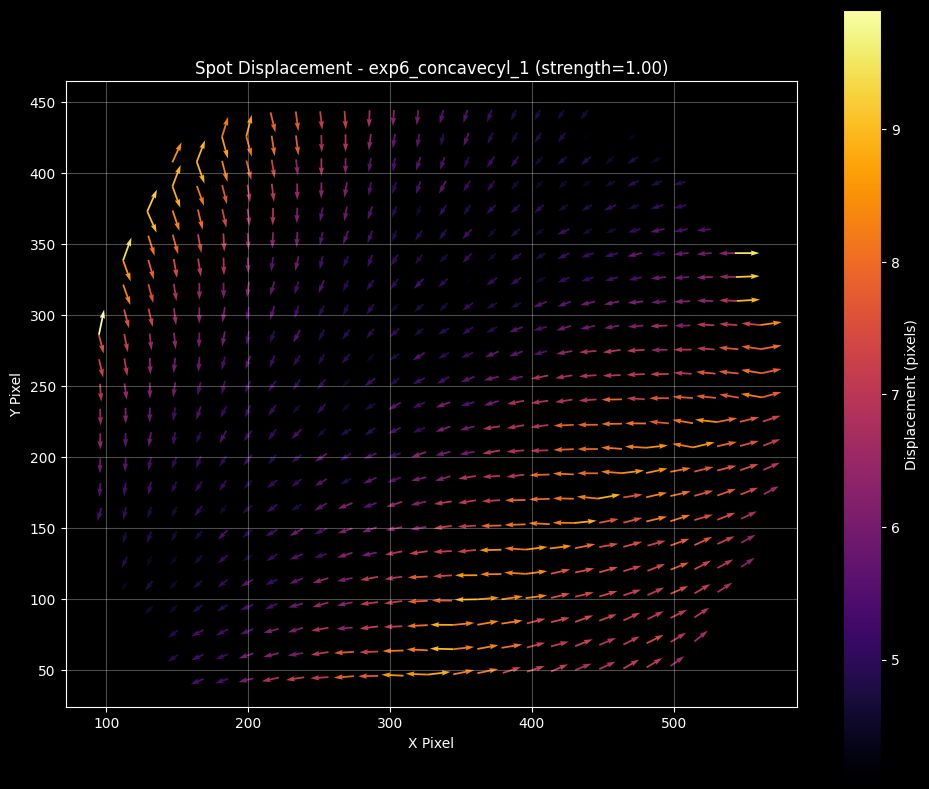

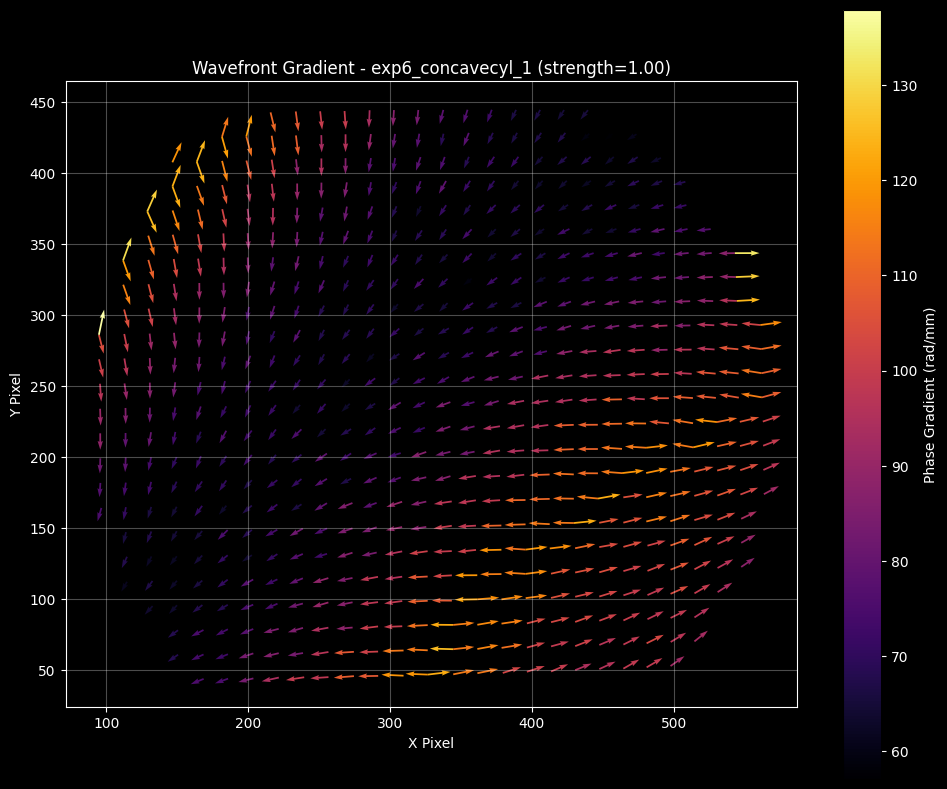

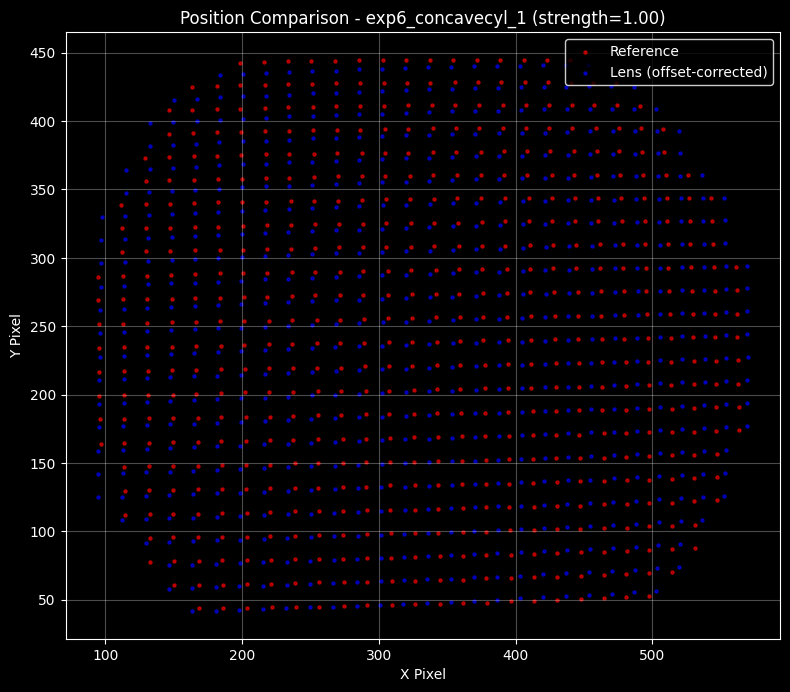

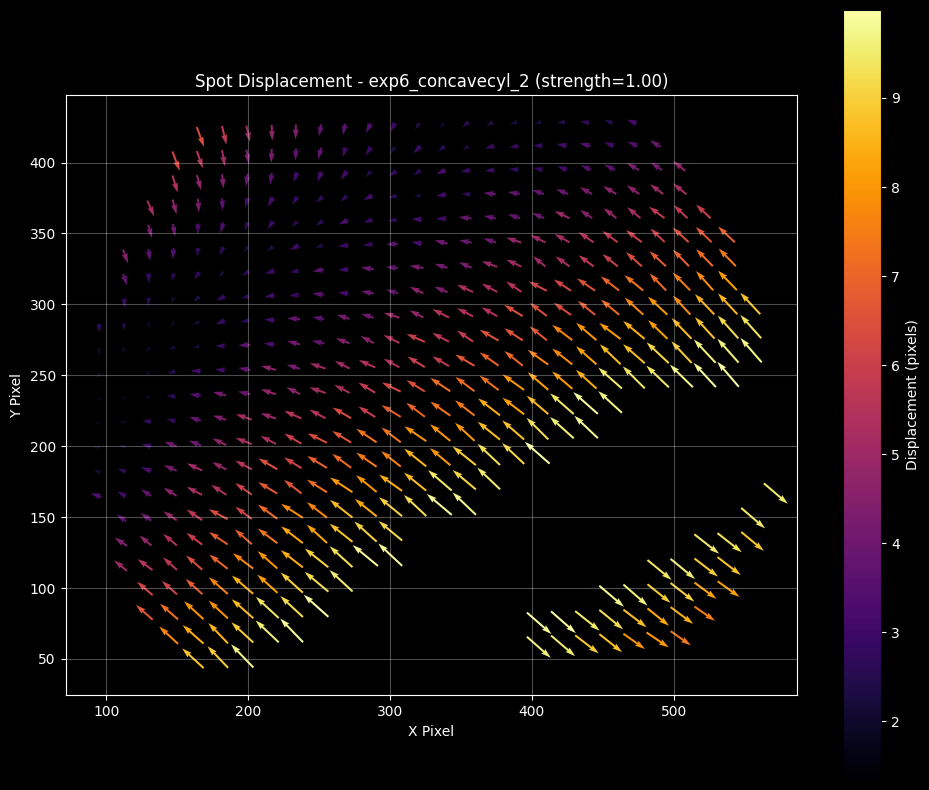

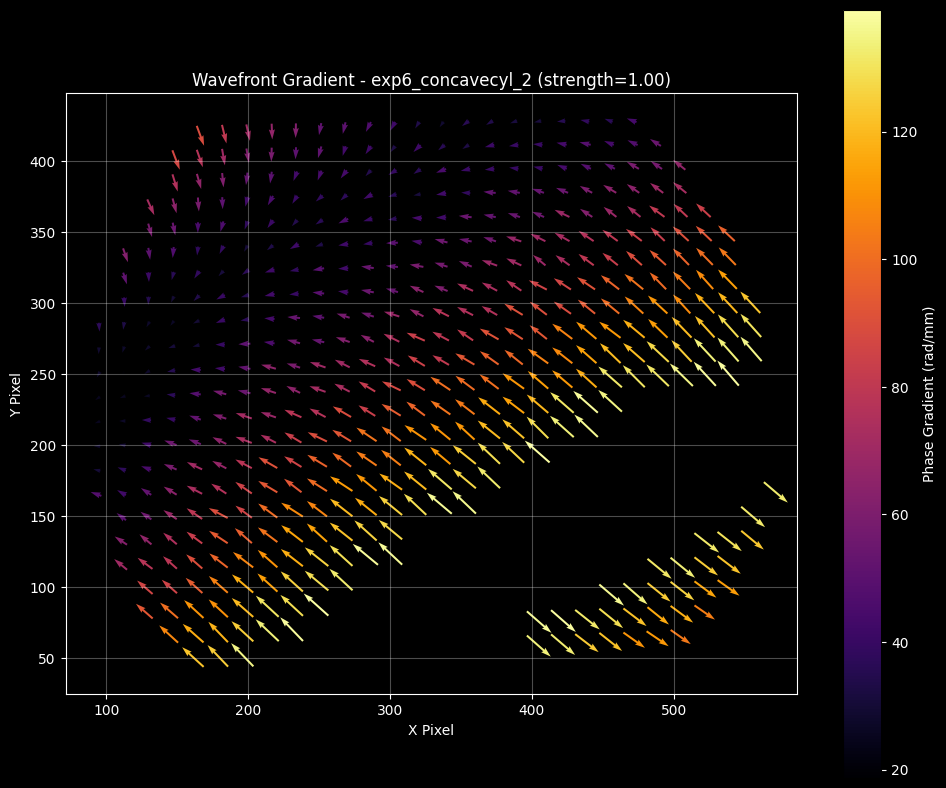

...

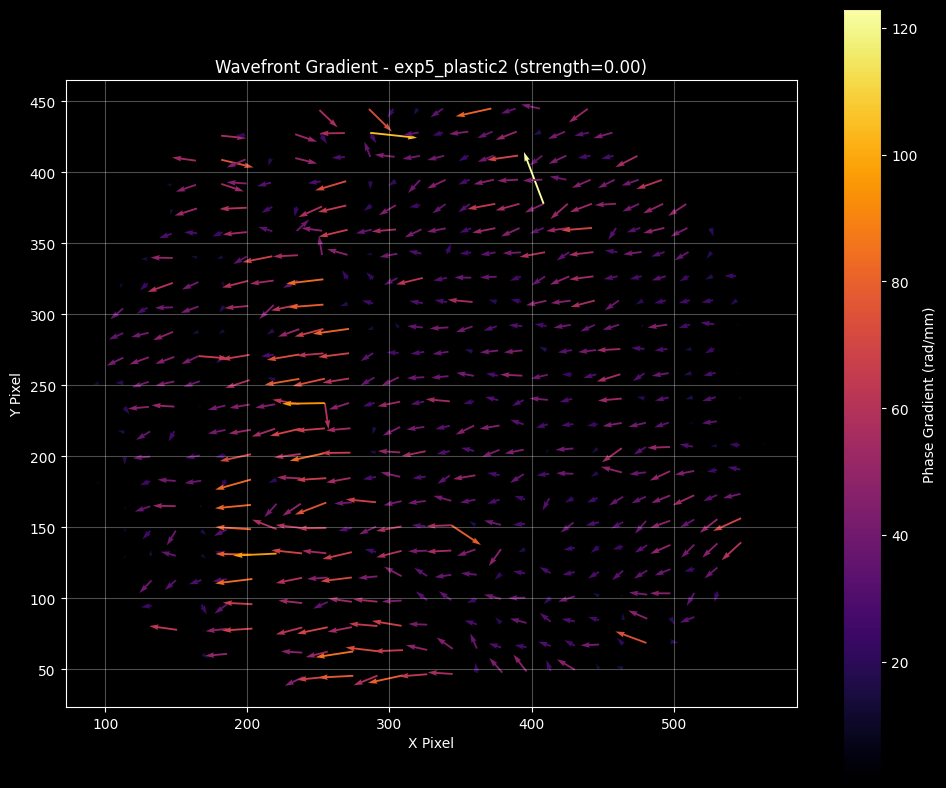

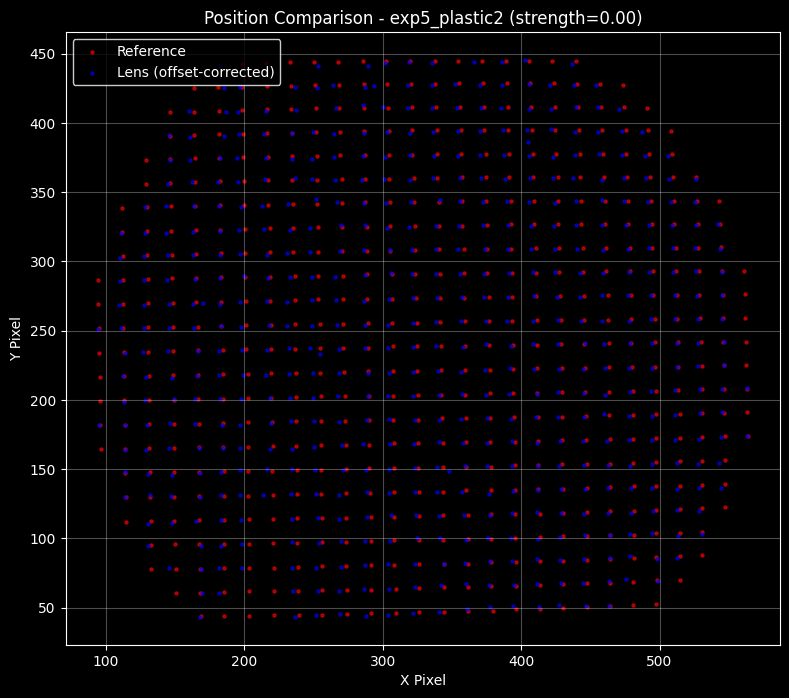

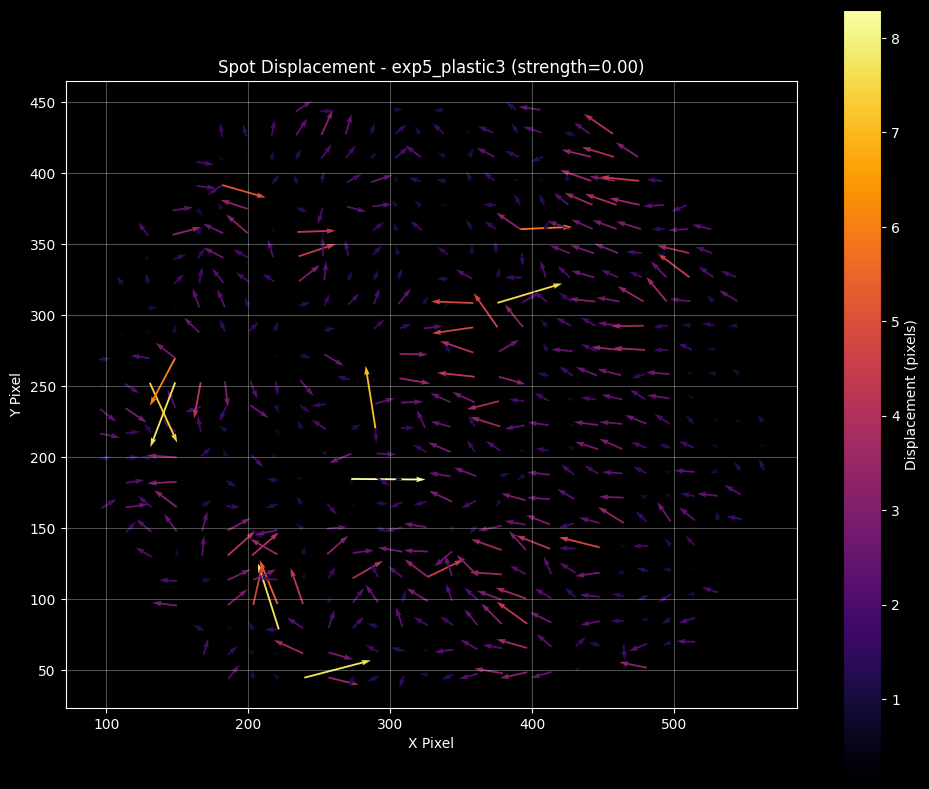

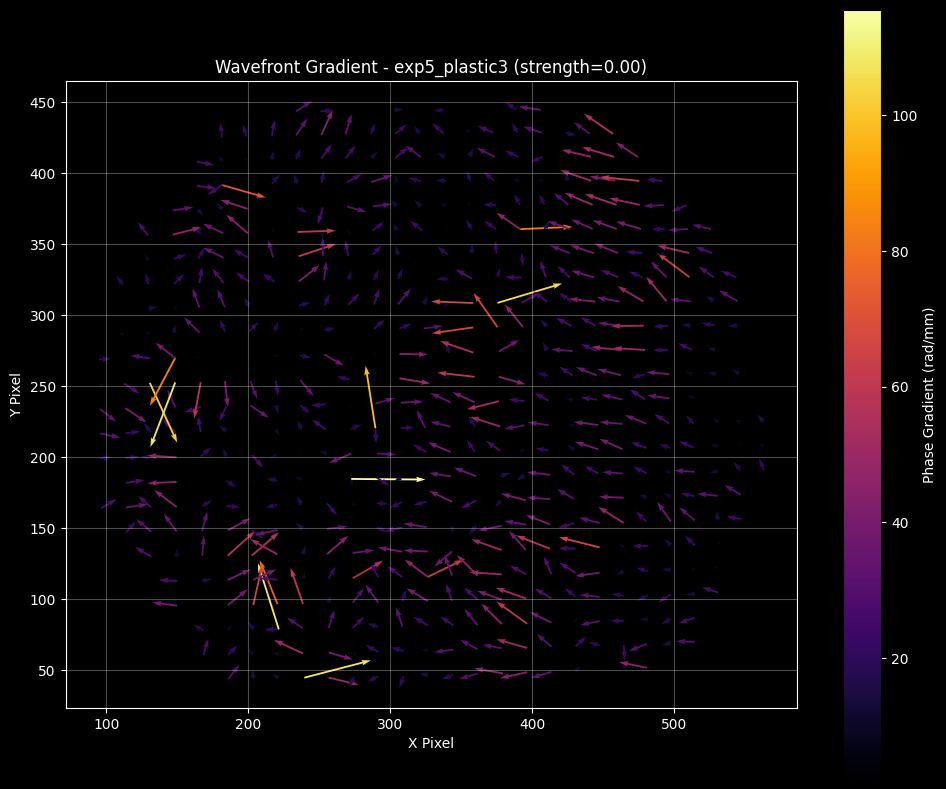

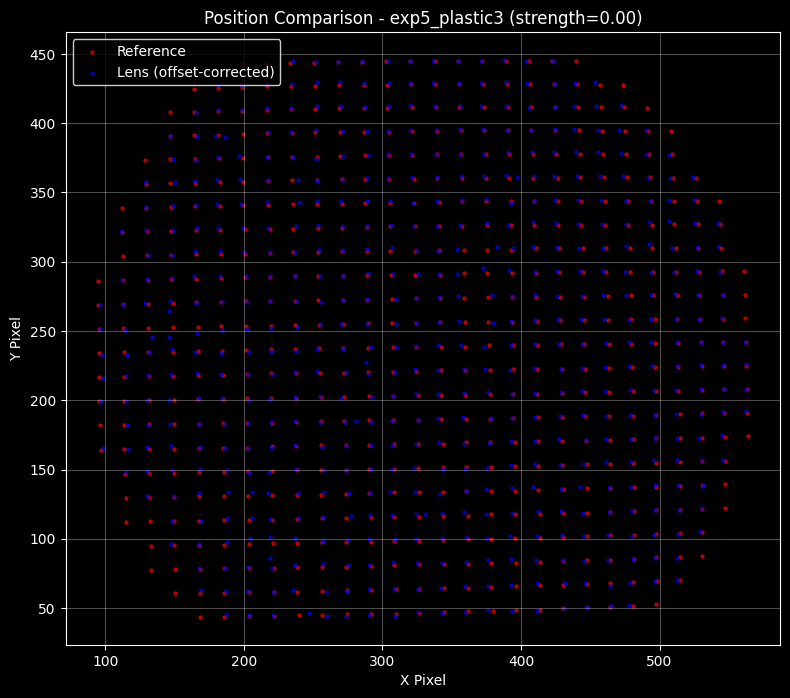

In [22]:
dark_background = True

for lens_name, result in all_results.items():
    disp = result['displacement']
    grad = result['gradient']
    strength = result['lens_strength']
    
    title_base = f"{lens_name} (strength={strength:.2f})"
    
    # Plot displacement in pixels
    plot_displacement_vectors(
        disp,
        title=f'Spot Displacement - {title_base}',
        colorbar_label='Displacement (pixels)',
        save_path=plot_dir + f'{lens_name}_displacement_pix.png',
        dark_background=dark_background
    )
    
    # Plot wavefront gradient
    plot_wavefront_gradient(
        disp['ref_x'], disp['ref_y'],
        grad,
        title=f'Wavefront Gradient - {title_base}',
        save_path=plot_dir + f'{lens_name}_wavefront_gradient.png',
        dark_background=dark_background
    )
    
    # Plot position comparison
    lens_positions = lens_results[lens_name]['positions']
    x_temp_offset = np.mean(lens_positions[:, 1]) - np.mean(ref_positions[:, 1])
    y_temp_offset = np.mean(lens_positions[:, 0]) - np.mean(ref_positions[:, 0])
    
    plot_position_comparison(
        ref_positions, lens_positions,
        x_temp_offset, y_temp_offset,
        title=f'Position Comparison - {title_base}',
        save_path=plot_dir + f'{lens_name}_position_comparison.png',
        dark_background=dark_background
    )

In [23]:
print("\nSummary Statistics by Lens Type:")
print("=" * 80)

lens_type_summary = {}
for lens_name, result in all_results.items():
    lens_type = result['lens_type']
    if lens_type not in lens_type_summary:
        lens_type_summary[lens_type] = {
            'displacements': [],
            'gradients': []
        }
    
    lens_type_summary[lens_type]['displacements'].append(
        np.mean(result['displacement']['magnitude_pix'])
    )
    lens_type_summary[lens_type]['gradients'].append(
        np.mean(result['gradient']['magnitude'])
    )

for lens_type, data in lens_type_summary.items():
    mean_disp = np.mean(data['displacements'])
    std_disp = np.std(data['displacements']) / np.sqrt(len(data['displacements']))
    
    mean_grad = np.mean(data['gradients'])
    std_grad = np.std(data['gradients']) / np.sqrt(len(data['gradients']))
    
    print(f"\n{lens_type.replace('_', ' ').title()}:")
    print(f"  Mean displacement: {mean_disp:.3f} ± {std_disp:.3f} pixels")
    print(f"  Mean phase gradient: {mean_grad:.2f} ± {std_grad:.2f} rad/mm")


Summary Statistics by Lens Type:

Concave Cyl:
  Mean displacement: 5.977 ± 0.243 pixels
  Mean phase gradient: 83.24 ± 3.38 rad/mm

Concave Sph:
  Mean displacement: 4.169 ± 1.853 pixels
  Mean phase gradient: 58.07 ± 25.81 rad/mm

Convex Cyl:
  Mean displacement: 5.385 ± 1.363 pixels
  Mean phase gradient: 75.00 ± 18.99 rad/mm

Convex Sph:
  Mean displacement: 6.428 ± 0.643 pixels
  Mean phase gradient: 89.53 ± 8.96 rad/mm

Plastic:
  Mean displacement: 3.117 ± 0.672 pixels
  Mean phase gradient: 43.42 ± 9.36 rad/mm


## Aberration Correction Using Zernike Polynomials

**Goal:** Reconstruct the wavefront shape and simulate correction.

**Method:**
1. **Fit Zernike polynomials** to measured phase gradients
   - Zernike polynomials form an orthogonal basis on a circle
   - Each term represents a specific aberration mode (tilt, defocus, astigmatism, coma, etc.)
2. **Reconstruct wavefront** from fitted coefficients
3. **Calculate Strehl ratio** to quantify image quality
   - Strehl ratio = peak intensity with aberration / ideal peak intensity
   
4. **Simulate correction** by removing systematic (fitted) component
5. **Calculate residual** aberrations after correction

**Zernike Modes (in order):**
- Piston (0,0): Overall phase shift
- Tilt (1,-1), (1,1): Linear gradients (tip/tilt)
- Defocus (2,0): Spherical defocus
- Astigmatism (2,-2), (2,2): Cylindrical aberrations at 45°
- Coma (3,-1), (3,1): Off-axis aberrations
- Higher orders: Trefoil, spherical aberration, etc.

In [24]:
def zernike_polynomial(n, m, rho, theta):
    """
    Calculate Zernike polynomial Z_n^m at positions (rho, theta).
    
    Parameters:
    -----------
    n : int
        Radial order
    m : int
        Azimuthal frequency
    rho : array
        Radial coordinate (0 to 1)
    theta : array
        Azimuthal coordinate (radians)
    
    Returns:
    --------
    Z : array
        Zernike polynomial values
    """
    if (n - abs(m)) % 2 != 0:
        return np.zeros_like(rho)
    
    R = np.zeros_like(rho)
    for k in range((n - abs(m)) // 2 + 1):
        coef = ((-1)**k * math.factorial(n - k) / 
                (math.factorial(k) * 
                 math.factorial((n + abs(m)) // 2 - k) * 
                 math.factorial((n - abs(m)) // 2 - k)))
        R += coef * rho**(n - 2*k)
    
    if m >= 0:
        Z = R * np.cos(m * theta)
    else:
        Z = R * np.sin(abs(m) * theta)
    
    return Z


def reconstruct_wavefront(x, y, coefficients, zernike_indices, normalization):
    """
    Reconstruct wavefront from Zernike coefficients.
    
    Parameters:
    -----------
    x, y : array
        Position arrays
    coefficients : array
        Zernike coefficients
    zernike_indices : list
        List of (n, m) tuples
    normalization : tuple
        (x_center, y_center, max_r) for coordinate normalization
    
    Returns:
    --------
    wavefront : array
        Reconstructed wavefront phase
    """
    x_center, y_center, max_r = normalization
    
    x_norm = x - x_center
    y_norm = y - y_center
    rho = np.sqrt(x_norm**2 + y_norm**2) / max_r
    theta = np.arctan2(y_norm, x_norm)
    
    wavefront = np.zeros_like(rho)
    for coef, (n, m) in zip(coefficients, zernike_indices):
        wavefront += coef * zernike_polynomial(n, m, rho, theta)
    
    return wavefront


def calculate_strehl_ratio(wavefront_rms_rad, wavelength_nm=580):
    """
    Calculate Strehl ratio from wavefront RMS error using Maréchal approximation.
    
    Parameters:
    -----------
    wavefront_rms_rad : float
        RMS wavefront error in radians
    wavelength_nm : float
        Wavelength in nanometers
    
    Returns:
    --------
    strehl : float
        Strehl ratio (0 to 1)
    """
    
    strehl = np.exp(-wavefront_rms_rad**2)
    
    return max(0.0, min(1.0, strehl))


def integrate_gradients_to_wavefront(x, y, grad_x, grad_y):
    """
    Integrate phase gradients to reconstruct wavefront using least squares.
    
    Parameters:
    -----------
    x, y : array
        Position arrays in pixels
    grad_x, grad_y : array
        Phase gradient components in rad/mm
    
    Returns:
    --------
    wavefront : array
        Reconstructed wavefront phase in radians
    """
    N = len(x)
    
    pixel_size_mm = 6e-3
    x_mm = x * pixel_size_mm
    y_mm = y * pixel_size_mm
    
    tree = cKDTree(np.column_stack([x_mm, y_mm]))
    
    distances, indices = tree.query(np.column_stack([x_mm, y_mm]), k=5)
    
    equations = []
    
    for i in range(N):
        for j in range(1, 5):
            if j >= len(indices[i]):
                continue
            neighbor_idx = indices[i][j]
            dist = distances[i][j]
            
            if dist > 0 and dist < 0.2:
                dx_mm = x_mm[neighbor_idx] - x_mm[i]
                dy_mm = y_mm[neighbor_idx] - y_mm[i]
                
                avg_grad_x = (grad_x[i] + grad_x[neighbor_idx]) / 2
                avg_grad_y = (grad_y[i] + grad_y[neighbor_idx]) / 2
                
                expected_dphi = avg_grad_x * dx_mm + avg_grad_y * dy_mm
                
                equations.append((i, neighbor_idx, expected_dphi))
    
    n_eq = len(equations)
    A = np.zeros((n_eq, N))
    b = np.zeros(n_eq)
    
    for eq_idx, (i, j, target) in enumerate(equations):
        A[eq_idx, i] = -1
        A[eq_idx, j] = 1
        b[eq_idx] = target
    
    A_constrained = np.vstack([A, np.ones(N) / N])
    b_constrained = np.hstack([b, 0])
    
    phi, residuals, rank, s = np.linalg.lstsq(A_constrained, b_constrained, rcond=None)
    
    phi = phi - np.mean(phi)
    
    return phi


def fit_zernike_coefficients_from_phase(x, y, phase, n_terms=15):
    """
    Fit Zernike polynomials to wavefront phase.
    
    Parameters:
    -----------
    x, y : array
        Spot positions in pixels
    phase : array
        Wavefront phase in radians
    n_terms : int
        Number of Zernike terms to fit
    
    Returns:
    --------
    coefficients : array
        Fitted Zernike coefficients
    zernike_indices : list
        List of (n, m) tuples
    normalization : tuple
        Coordinate normalization parameters
    """
    x_center = np.mean(x)
    y_center = np.mean(y)
    x_norm = x - x_center
    y_norm = y - y_center
    
    max_r = np.sqrt(np.max(x_norm**2 + y_norm**2))
    rho = np.sqrt(x_norm**2 + y_norm**2) / max_r
    theta = np.arctan2(y_norm, x_norm)
    
    # First 15
    zernike_indices = [
        (0, 0),
        (1, -1),
        (1, 1),
        (2, -2),
        (2, 0),
        (2, 2),
        (3, -3),
        (3, -1),
        (3, 1),
        (3, 3),
        (4, -4),
        (4, -2),
        (4, 0),
        (4, 2),
        (4, 4),
    ]
    
    n_zernike = min(n_terms, len(zernike_indices))
    
    A = np.zeros((len(rho), n_zernike))
    for i, (n, m) in enumerate(zernike_indices[:n_zernike]):
        A[:, i] = zernike_polynomial(n, m, rho, theta)
    
    coefficients, residuals, rank, s = np.linalg.lstsq(A, phase, rcond=None)
    
    return coefficients, zernike_indices[:n_zernike], (x_center, y_center, max_r)

def correct_aberration(ref_x, ref_y, lens_x, lens_y, dx, dy, phase_x, phase_y):
    """
    Calculate corrected positions after aberration removal.
    
    Parameters:
    -----------
    ref_x, ref_y : array
        Reference spot positions
    lens_x, lens_y : array
        Aberrated spot positions
    dx, dy : array
        Displacement vectors
    phase_x, phase_y : array
        Phase gradient components in rad/mm
    
    Returns:
    --------
    dict containing corrected positions and correction metrics
    """
    wavefront = integrate_gradients_to_wavefront(ref_x, ref_y, phase_x, phase_y)
    
    rms_wavefront = np.std(wavefront)
    pv_wavefront = np.ptp(wavefront)
    
    wavelength_mm = 580e-6
    
    # Convert to waves for better interpretation
    rms_waves = rms_wavefront / (2 * np.pi)
    pv_waves = pv_wavefront / (2 * np.pi)
    
    # Only calculate Strehl if RMS is reasonable (< 5 radians ≈ 0.8 waves)
    if rms_wavefront < 5:
        strehl_uncorrected = calculate_strehl_ratio(rms_wavefront)
    else:
        strehl_uncorrected = 0.0
    
    coefficients, zernike_indices, normalization = fit_zernike_coefficients_from_phase(
        ref_x, ref_y, wavefront, n_terms=15
    )
    
    wavefront_fitted = reconstruct_wavefront(ref_x, ref_y, coefficients, 
                                            zernike_indices, normalization)
    
    if np.std(wavefront) > 0:
        correlation = np.corrcoef(wavefront_fitted, wavefront)[0, 1]
        correction_efficiency = max(0, correlation**2)
    else:
        correction_efficiency = 0
    
    residual_wavefront = wavefront - wavefront_fitted
    rms_residual_wavefront = np.std(residual_wavefront)
    pv_residual_wavefront = np.ptp(residual_wavefront)
    
    rms_residual_waves = rms_residual_wavefront / (2 * np.pi)
    pv_residual_waves = pv_residual_wavefront / (2 * np.pi)
    
    if rms_residual_wavefront < 5:
        strehl_corrected = calculate_strehl_ratio(rms_residual_wavefront)
    else:
        strehl_corrected = 0.0
    
    corrected_x = lens_x - dx * correction_efficiency
    corrected_y = lens_y - dy * correction_efficiency
    
    residual_dx = corrected_x - ref_x
    residual_dy = corrected_y - ref_y
    residual_magnitude = np.sqrt(residual_dx**2 + residual_dy**2)
    
    original_magnitude = np.sqrt(dx**2 + dy**2)
    
    return {
        'corrected_x': corrected_x,
        'corrected_y': corrected_y,
        'residual_dx': residual_dx,
        'residual_dy': residual_dy,
        'residual_magnitude': residual_magnitude,
        'wavefront': wavefront,
        'wavefront_fitted': wavefront_fitted,
        'residual_wavefront': residual_wavefront,
        'coefficients': coefficients,
        'zernike_indices': zernike_indices,
        'strehl_ratio': strehl_uncorrected,
        'strehl_corrected': strehl_corrected,
        'rms_wavefront': rms_wavefront,
        'rms_wavefront_waves': rms_waves,
        'pv_wavefront': pv_wavefront,
        'pv_wavefront_waves': pv_waves,
        'rms_residual_wavefront': rms_residual_wavefront,
        'rms_residual_waves': rms_residual_waves,
        'pv_residual_wavefront': pv_residual_wavefront,
        'pv_residual_waves': pv_residual_waves,
        'rms_residual': np.std(residual_magnitude),
        'mean_original_displacement': np.mean(original_magnitude),
        'mean_residual_displacement': np.mean(residual_magnitude),
        'correction_efficiency': correction_efficiency
    }

plotting functions

In [25]:
def plot_corrected_overlay(ref_x, ref_y, lens_x, lens_y, corrected_x, corrected_y,
                           title='Aberration Correction', save_path=None, 
                           dark_background=False):
    """
    Plot overlay of reference, aberrated, and corrected positions.
    
    Parameters:
    -----------
    ref_x, ref_y : array
        Reference positions
    lens_x, lens_y : array
        Aberrated positions
    corrected_x, corrected_y : array
        Corrected positions
    title : str
        Plot title
    save_path : str, optional
        Path to save figure
    dark_background : bool
        Use black or white background
    """
    bg_color = 'black' if dark_background else 'white'
    text_color = 'white' if dark_background else 'black'
    
    fig, ax = plt.subplots(figsize=(10, 10), facecolor=bg_color)
    
    ax.scatter(ref_x, ref_y, color='green', s=30, label='Reference', 
              alpha=0.7, marker='o', edgecolors=text_color, linewidths=0.5)
    ax.scatter(lens_x, lens_y, color='red', s=30, label='Aberrated', 
              alpha=0.5, marker='x')
    ax.scatter(corrected_x, corrected_y, color='cyan', s=20, label='Corrected', 
              alpha=0.7, marker='+', linewidths=1.5)
    
    ax.set_xlabel('X Pixel', color=text_color)
    ax.set_ylabel('Y Pixel', color=text_color)
    ax.set_title(title, color=text_color)
    ax.set_aspect('equal')
    
    legend = ax.legend(facecolor=bg_color, edgecolor=text_color)
    plt.setp(legend.get_texts(), color=text_color)
    
    ax.grid(alpha=0.3, color=text_color)
    ax.set_facecolor(bg_color)
    ax.tick_params(colors=text_color)
    
    if dark_background:
        for spine in ax.spines.values():
            spine.set_color(text_color)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, facecolor=bg_color)
    
    plt.show()
    
    return fig, ax


def plot_residual_vectors(ref_x, ref_y, residual_dx, residual_dy, 
                         residual_magnitude, title='Residual Aberration',
                         save_path=None, dark_background=False):
    """
    Plot residual displacement vectors after correction.
    
    Parameters:
    -----------
    ref_x, ref_y : array
        Reference positions
    residual_dx, residual_dy : array
        Residual displacement components
    residual_magnitude : array
        Magnitude of residual displacement
    title : str
        Plot title
    save_path : str, optional
        Path to save figure
    dark_background : bool
        Use black or white background
    """
    bg_color = 'black' if dark_background else 'white'
    text_color = 'white' if dark_background else 'black'
    
    fig, ax = plt.subplots(figsize=(10, 8), facecolor=bg_color)
    
    q = ax.quiver(ref_x, ref_y, residual_dx, residual_dy, residual_magnitude,
                  cmap='viridis', scale=None, scale_units='xy')
    
    cbar = plt.colorbar(q, ax=ax)
    cbar.set_label('Residual Displacement (pixels)', color=text_color)
    if dark_background:
        cbar.ax.yaxis.set_tick_params(color=text_color)
        plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color=text_color)
    
    ax.set_xlabel('X Pixel', color=text_color)
    ax.set_ylabel('Y Pixel', color=text_color)
    ax.set_title(title, color=text_color)
    ax.set_aspect('equal')
    ax.grid(alpha=0.3, color=text_color)
    ax.set_facecolor(bg_color)
    ax.tick_params(colors=text_color)
    
    if dark_background:
        for spine in ax.spines.values():
            spine.set_color(text_color)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, facecolor=bg_color)
    
    plt.show()
    
    return fig, ax


def plot_wavefront_surface(x, y, wavefront, title='Reconstructed Wavefront',
                           save_path=None, dark_background=False):
    """
    Plot 2D wavefront surface.
    
    Parameters:
    -----------
    x, y : array
        Position arrays
    wavefront : array
        Wavefront phase values
    title : str
        Plot title
    save_path : str, optional
        Path to save figure
    dark_background : bool
        Use black or white background
    """
    bg_color = 'black' if dark_background else 'white'
    text_color = 'white' if dark_background else 'black'
    
    fig, ax = plt.subplots(figsize=(10, 8), facecolor=bg_color)
    
    scatter = ax.scatter(x, y, c=wavefront, cmap='RdBu_r', s=50)
    
    cbar = plt.colorbar(scatter, ax=ax)
    cbar.set_label('Wavefront Phase (rad)', color=text_color)
    if dark_background:
        cbar.ax.yaxis.set_tick_params(color=text_color)
        plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color=text_color)
    
    ax.set_xlabel('X Pixel', color=text_color)
    ax.set_ylabel('Y Pixel', color=text_color)
    ax.set_title(title, color=text_color)
    ax.set_aspect('equal')
    ax.grid(alpha=0.3, color=text_color)
    ax.set_facecolor(bg_color)
    ax.tick_params(colors=text_color)
    
    if dark_background:
        for spine in ax.spines.values():
            spine.set_color(text_color)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, facecolor=bg_color)
    
    plt.show()
    
    return fig, ax

call functions to process the corrections

In [26]:
print("Performing Aberration Corrections")

correction_results = {}

for lens_name, result in all_results.items():
    disp = result['displacement']
    grad = result['gradient']
    strength = result['lens_strength']
    
    print(f"\nCorrecting {lens_name} (strength={strength:.2f})")
    
    correction = correct_aberration(
        disp['ref_x'], disp['ref_y'],
        disp['lens_x'], disp['lens_y'],
        disp['dx'], disp['dy'],
        grad['phi_x'], grad['phi_y']
    )
    
    correction_results[lens_name] = correction
    
    print(f"  RMS Wavefront Error:        {correction['rms_wavefront_waves']:.3f} waves ({correction['rms_wavefront_waves']*580:.1f} nm)")
    print(f"  P-V Wavefront Error:        {correction['pv_wavefront_waves']:.3f} waves ({correction['pv_wavefront_waves']*580:.1f} nm)")
    print(f"  Strehl Ratio (uncorrected): {correction['strehl_ratio']:.2e}")
    print(f"  RMS Residual Wavefront:     {correction['rms_residual_waves']:.3f} waves ({correction['rms_residual_waves']*580:.1f} nm)")
    print(f"  Strehl Ratio (corrected):   {correction['strehl_corrected']:.2e}")
    print(f"  Correction Efficiency:      {correction['correction_efficiency']*100:.1f}%")
    print(f"  Original Mean Displacement: {correction['mean_original_displacement']:.4f} pixels")
    print(f"  Residual Mean Displacement: {correction['mean_residual_displacement']:.4f} pixels")

Performing Aberration Corrections

Correcting exp6_concavecyl_1 (strength=1.00)
  RMS Wavefront Error:        6.102 waves (3539.0 nm)
  P-V Wavefront Error:        26.202 waves (15197.0 nm)
  Strehl Ratio (uncorrected): 0.00e+00
  RMS Residual Wavefront:     0.524 waves (304.0 nm)
  Strehl Ratio (corrected):   1.95e-05
  Correction Efficiency:      99.3%
  Original Mean Displacement: 6.3202 pixels
  Residual Mean Displacement: 0.0466 pixels

Correcting exp6_concavecyl_2 (strength=1.00)
  RMS Wavefront Error:        6.329 waves (3671.1 nm)
  P-V Wavefront Error:        29.705 waves (17228.7 nm)
  Strehl Ratio (uncorrected): 0.00e+00
  RMS Residual Wavefront:     0.978 waves (567.0 nm)
  Strehl Ratio (corrected):   0.00e+00
  Correction Efficiency:      97.6%
  Original Mean Displacement: 5.6329 pixels
  Residual Mean Displacement: 0.1344 pixels

Correcting exp6_concavesph_1 (strength=0.75)
  RMS Wavefront Error:        3.065 waves (1777.8 nm)
  P-V Wavefront Error:        13.663 waves (

plotting the correction

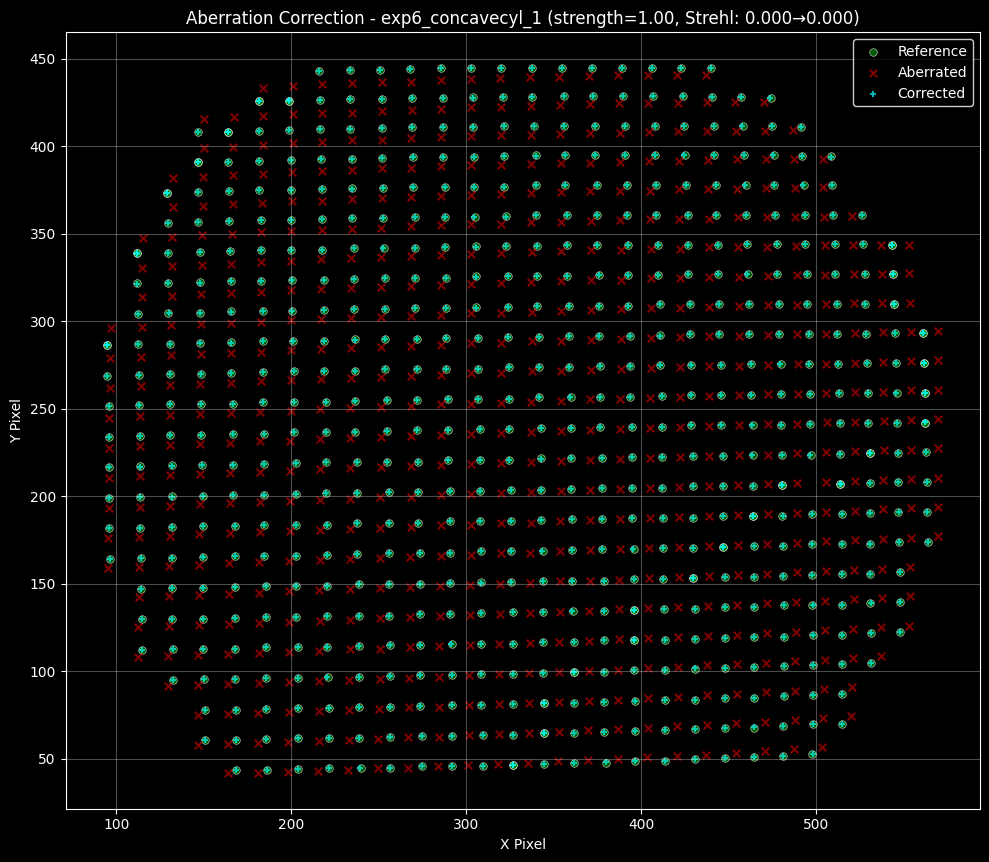

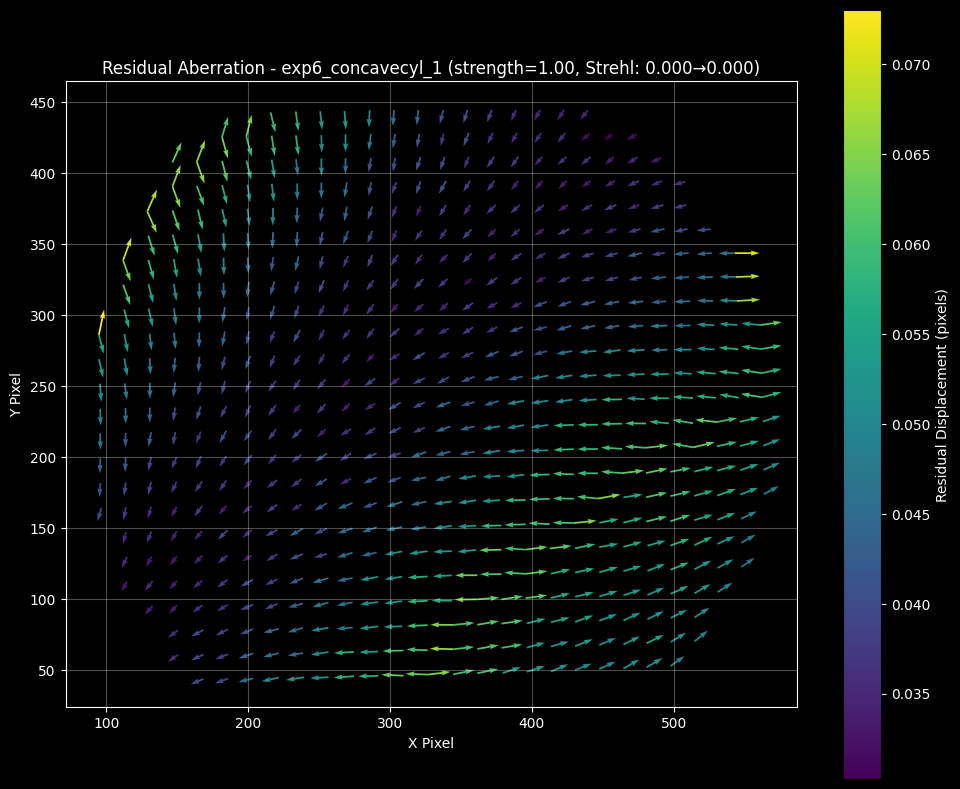

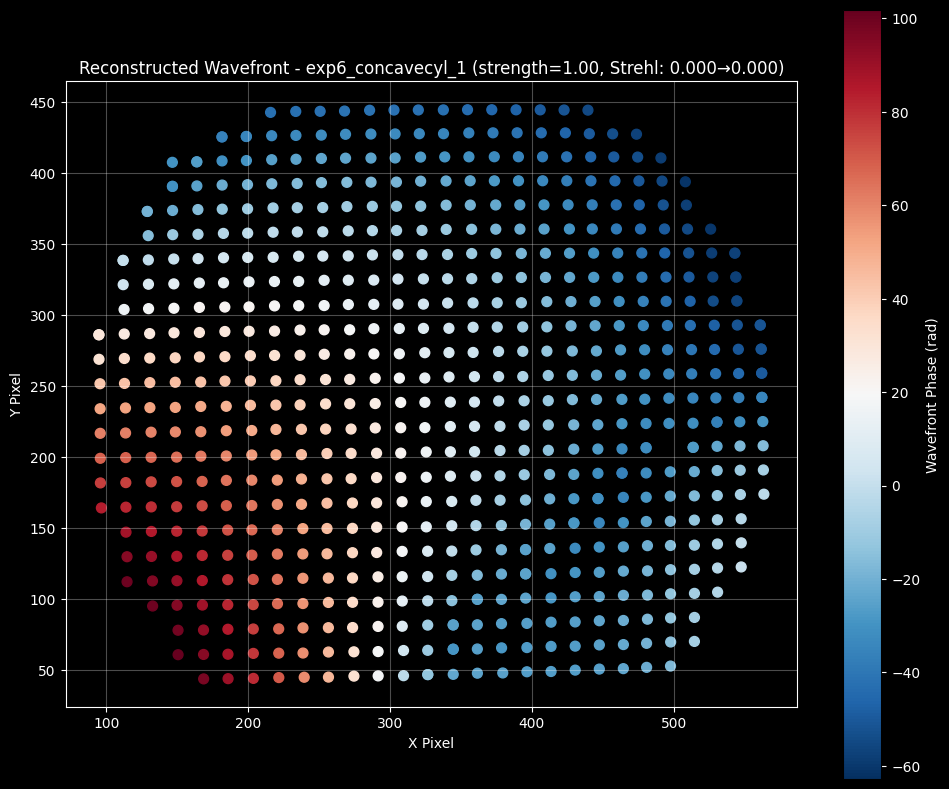

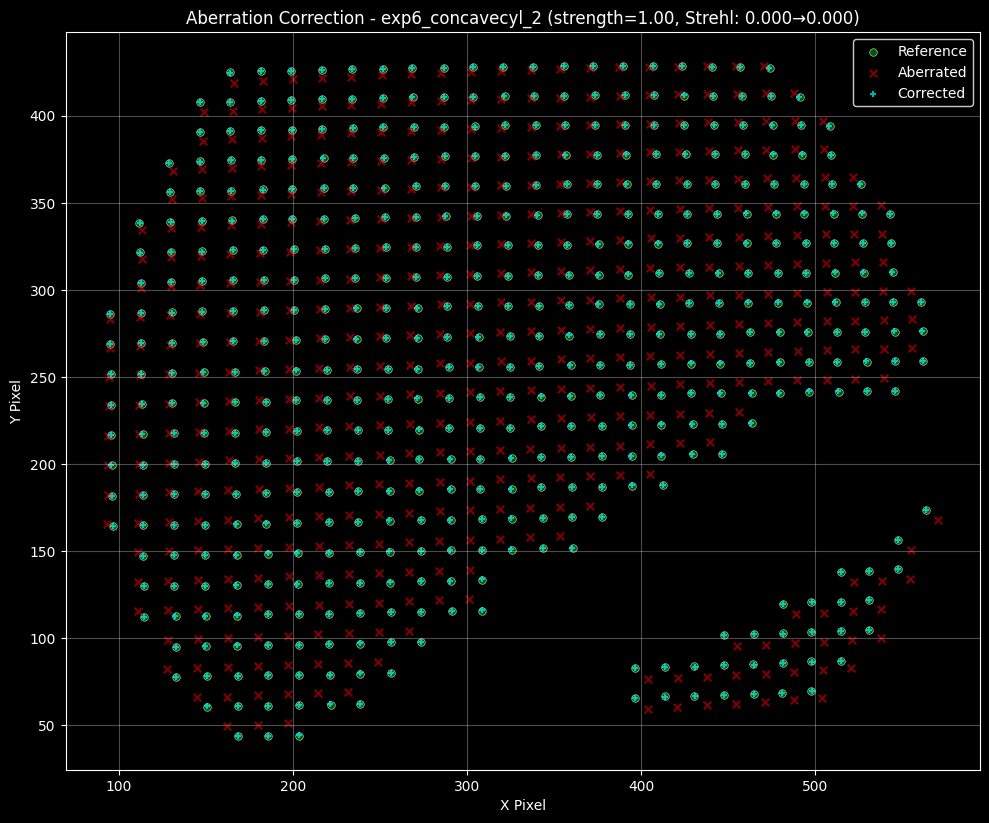

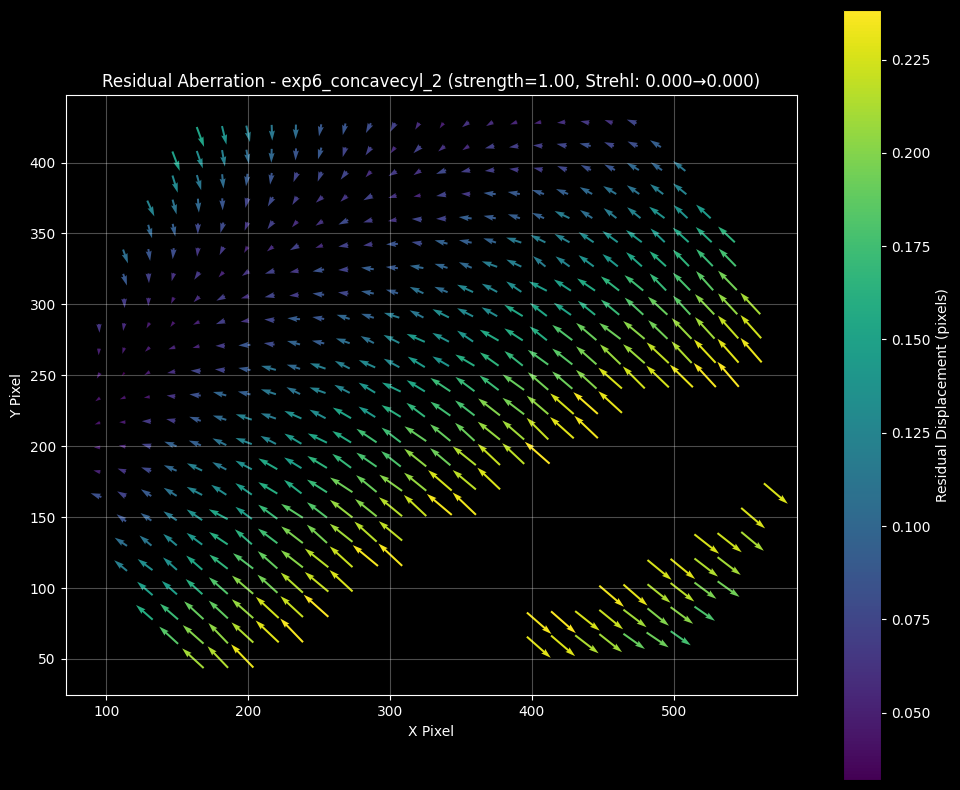

...

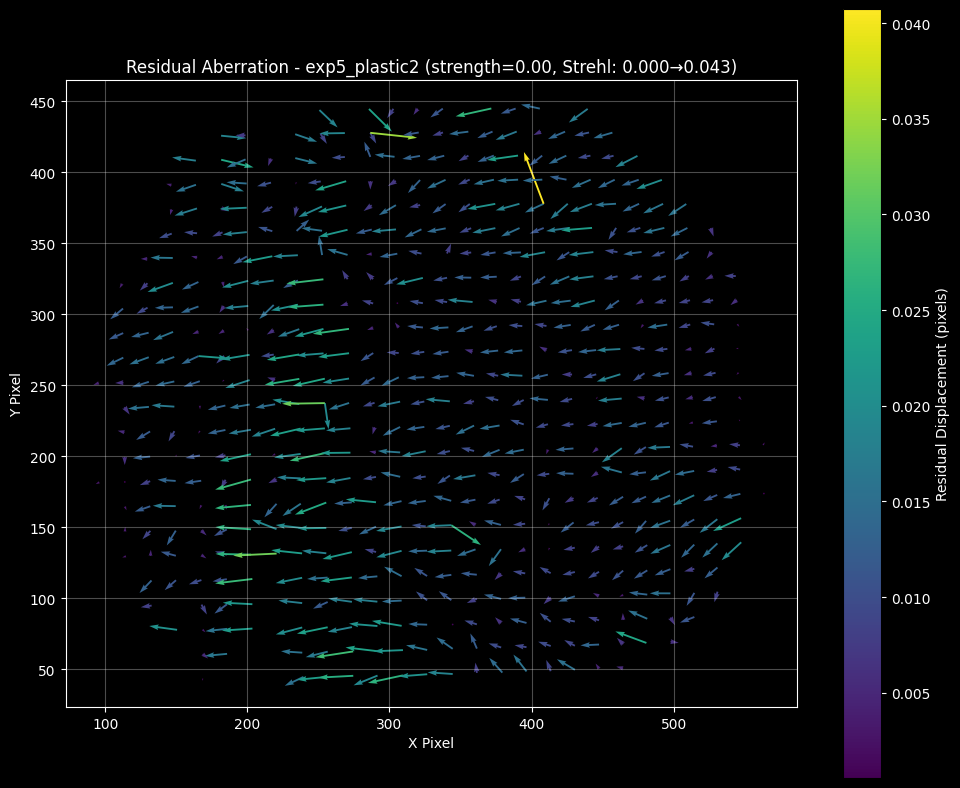

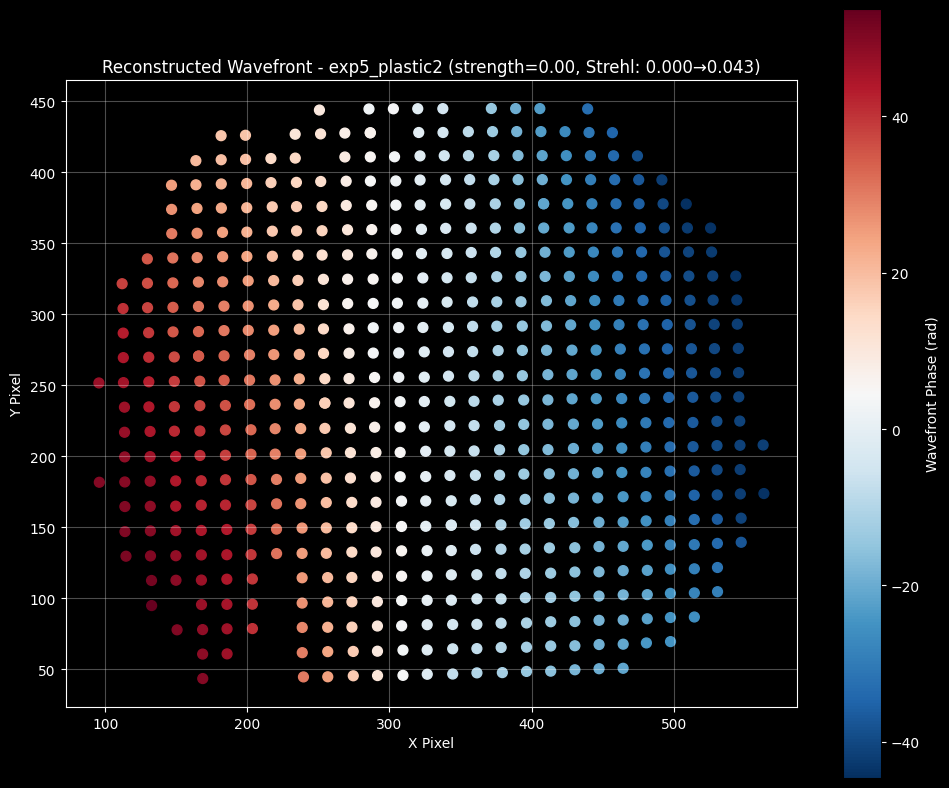

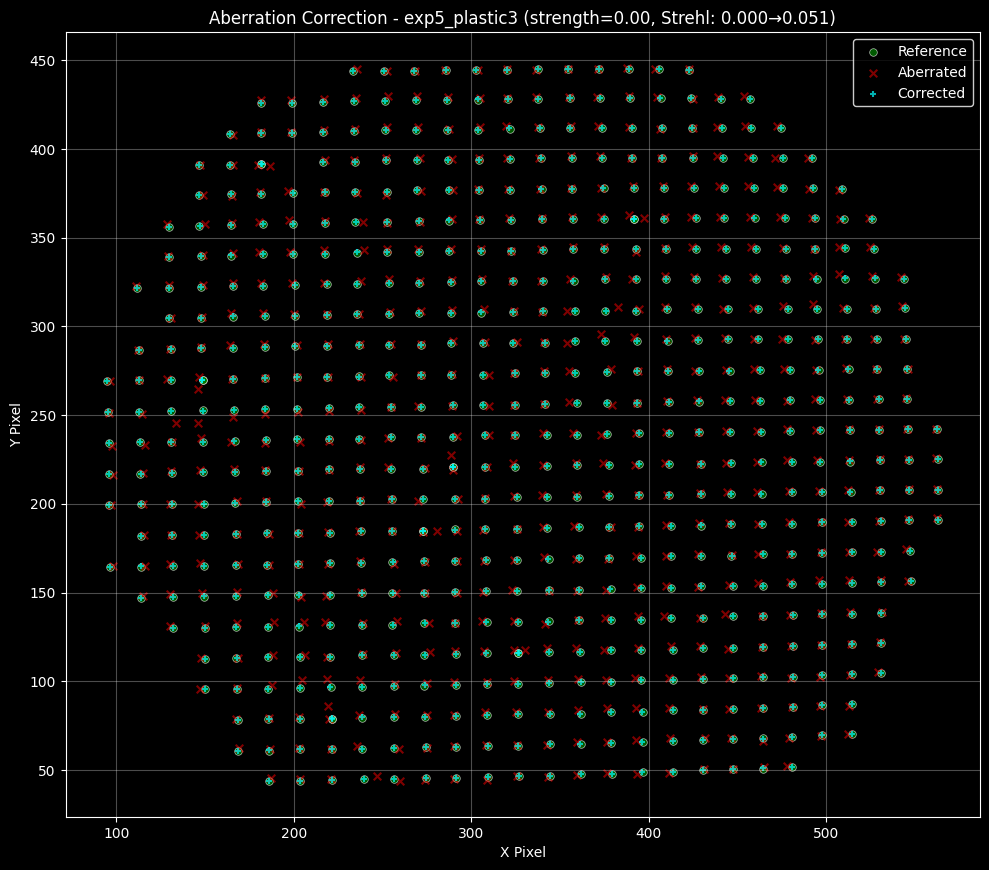

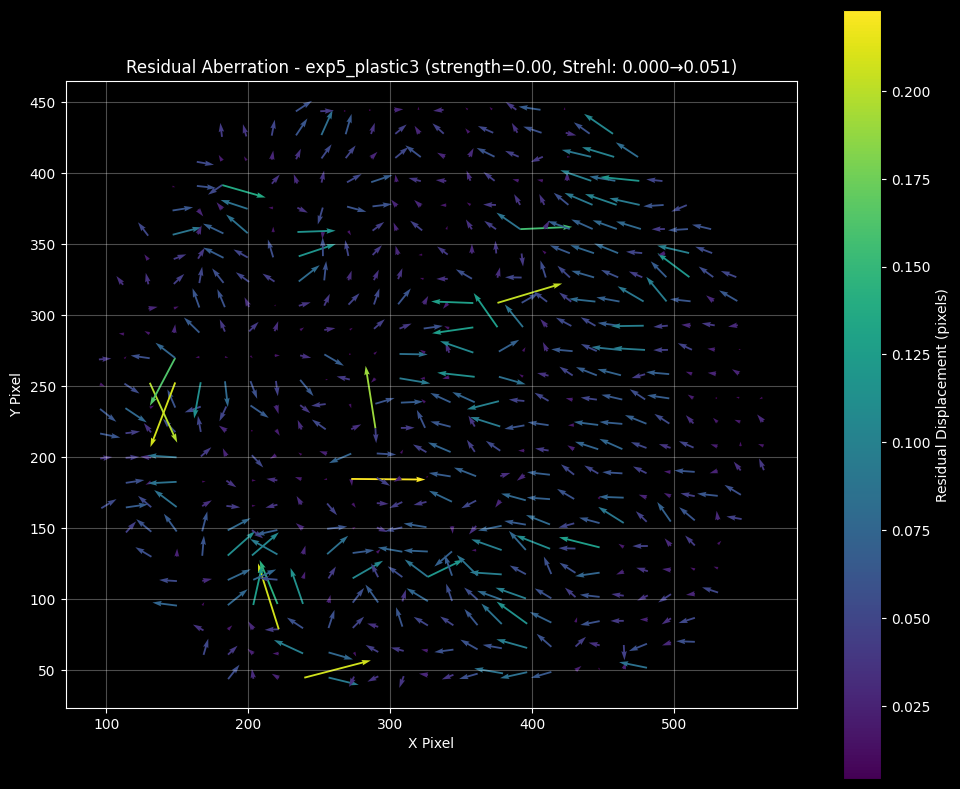

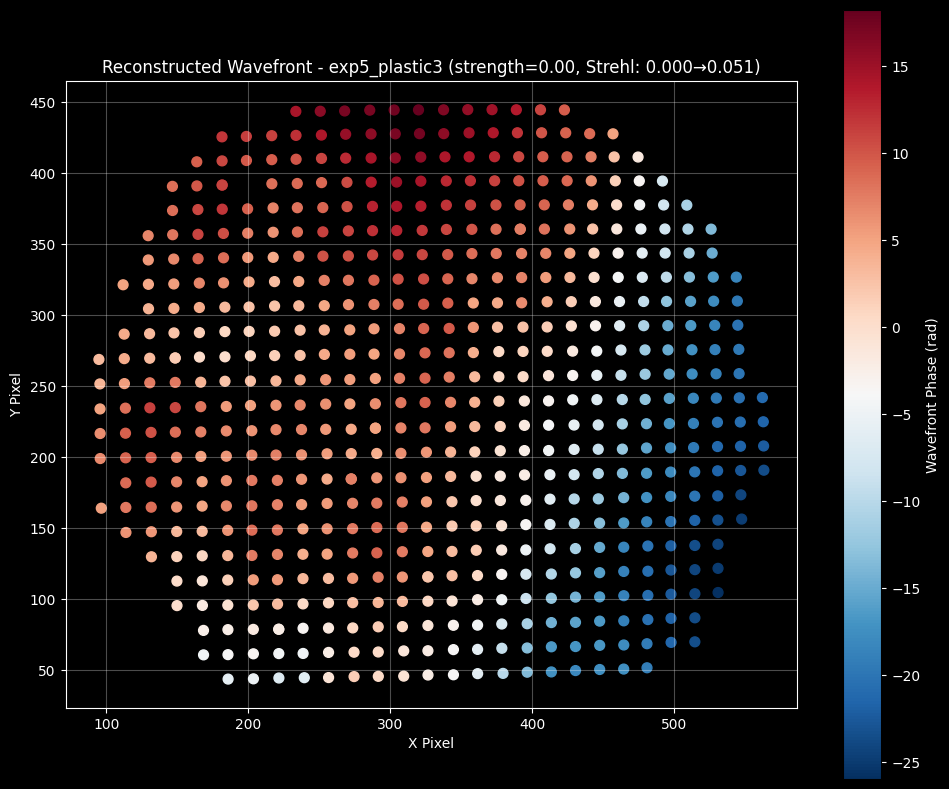

In [27]:
dark_background = True

for lens_name, result in all_results.items():
    disp = result['displacement']
    correction = correction_results[lens_name]
    strength = result['lens_strength']
    
    title_base = f"{lens_name} (strength={strength:.2f}, Strehl: {correction['strehl_ratio']:.3f}→{correction['strehl_corrected']:.3f})"
    
    # Plot overlay of reference, aberrated, and corrected positions
    plot_corrected_overlay(
        disp['ref_x'], disp['ref_y'],
        disp['lens_x'], disp['lens_y'],
        correction['corrected_x'], correction['corrected_y'],
        title=f'Aberration Correction - {title_base}',
        save_path=plot_dir + f'{lens_name}_correction_overlay.png',
        dark_background=dark_background
    )
    
    # Plot residual displacement vectors
    plot_residual_vectors(
        disp['ref_x'], disp['ref_y'],
        correction['residual_dx'], correction['residual_dy'],
        correction['residual_magnitude'],
        title=f'Residual Aberration - {title_base}',
        save_path=plot_dir + f'{lens_name}_residual_vectors.png',
        dark_background=dark_background
    )
    
    # Plot reconstructed wavefront surface
    plot_wavefront_surface(
        disp['ref_x'], disp['ref_y'],
        correction['wavefront'],
        title=f'Reconstructed Wavefront - {title_base}',
        save_path=plot_dir + f'{lens_name}_wavefront_surface.png',
        dark_background=dark_background
    )